Global Import Statement

In [ ]:
#Import section (will integrate to top once done)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from geopandas import GeoDataFrame
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import re
from pyproj import CRS, Transformer

#Import Folium packages
import folium
from folium.features import GeoJsonPopup
from folium.plugins import TimeSliderChoropleth
from folium.plugins import DualMap, TimeSliderChoropleth
from folium import GeoJson


# Import Shapely
from shapely import wkt
from shapely.geometry import Point, Polygon


# import sklearn modules
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, mean_squared_error, mean_absolute_error, accuracy_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor
from sklearn.model_selection import RandomizedSearchCV

#Import and moutn google collab
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


JAMES

In [ ]:
# Load the Occurance Data Set
# The file being read in is a copy of 'WaterlooRegionIncidentDatawith_Dissemination_area_and_block.csv' renamed to OccurenceData for simplicity/Filepath length issues
occurrence_data_fp = r'/content/drive/MyDrive/Group 3 Machine Learning/Project Files/Data/Outputs/WaterlooRegionIncidentDatawith_Dissemination_area_and_block.csv'
dOccurrences = pd.read_csv(occurrence_data_fp)
dOccurrences.shape

# Read the Proximity Data
proximity_data_fp = r"/content/drive/MyDrive/Group 3 Machine Learning/Project Files/Data/Outputs/Waterloo_region_proximity_withGeography_df.csv"
dProximity = pd.read_csv(proximity_data_fp,encoding='latin1')
dProximity.replace(to_replace="..",value=0,inplace=True)
dProximity['geometry'] = dProximity['geometry'].apply(wkt.loads)

<ipython-input-2-2d27e493450d>:4: DtypeWarning: Columns (4,13) have mixed types. Specify dtype option on import or set low_memory=False.
  dOccurrences = pd.read_csv(occurrence_data_fp)


In [ ]:
print("# of Dissemination Blocks: {}".format(len(dOccurrences['dissemination_block'].unique().tolist())))
print("# of Dissemination Areas: {}".format(len(dOccurrences['dissemination_area'].unique().tolist())))

# of Dissemination Blocks: 3650
# of Dissemination Areas: 738


In [ ]:
# Break the Date and Time into Weekday and Hour
dOccurrences[['ReportedDate','ReportedTime']] = dOccurrences['ReportedDateandTime'].str.split(" ",expand=True)
dOccurrences['Weekday'] = dOccurrences['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").weekday())
dOccurrences['Hour'] = dOccurrences['ReportedTime'].apply(lambda x: datetime.strptime(x, "%H:%M:%S").hour)

In [ ]:
# Selecting records with specific call groups of interest.
selected_call_groups = ['Auto Theft', 'Break and Enter', 'Domestic Violence', 'Fraud',
                          'Mental Health', 'Offence against person', 'Robbery',
                          'Theft Under (shoplifting)', 'Theft Over', 'Murder', 'Threatening']
dOccurrences = dOccurrences[dOccurrences['CallGrouping'].isin(selected_call_groups)]

<Axes: ylabel='count'>

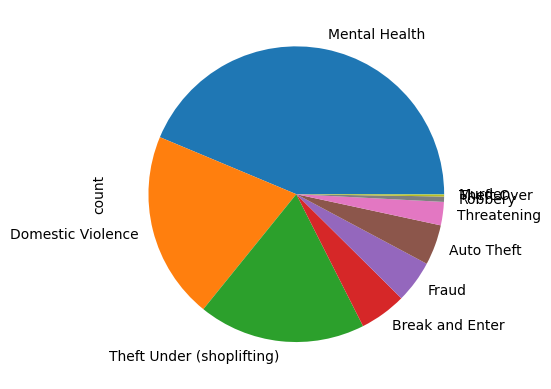

In [ ]:
# Retrieve the counts for each call group
dOccurrences['CallGrouping'].value_counts().plot.pie()

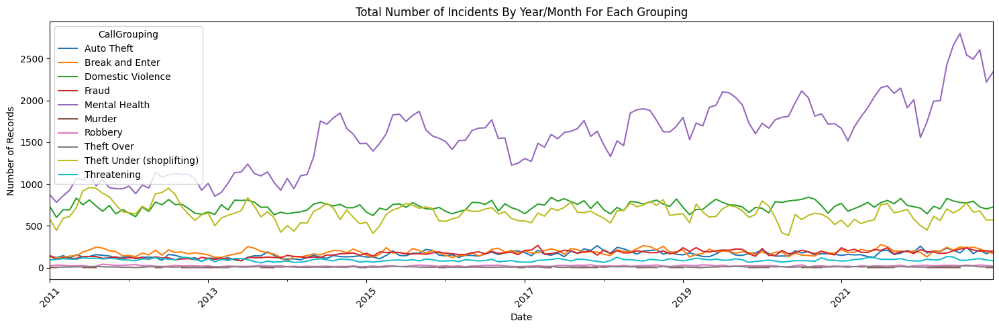

In [ ]:
# Plot the incidents
dPlot = dOccurrences.copy(deep=True)
dPlot['YearMonth'] = pd.to_datetime(dPlot['Year'].astype(str) + '-' + dPlot['Month'].astype(str), format='%Y-%m')
dPlot = dPlot.groupby(['YearMonth', 'CallGrouping']).size().unstack()
dPlot.plot(kind='line', figsize=(15, 5))

plt.xlabel('Date')
plt.ylabel("Number of Records")
plt.title("Total Number of Incidents By Year/Month For Each Grouping")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


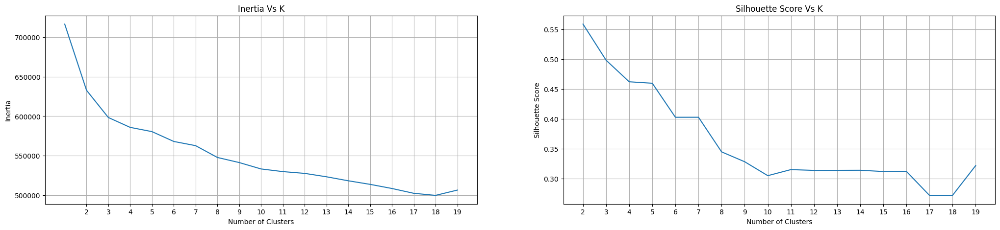

In [ ]:
# Generate a new array with the value counts of occurances for date/dissemination area
dValueCounts = dOccurrences.groupby('ReportedDate')['dissemination_area'].value_counts().unstack(fill_value=0)
X = dValueCounts.copy()
X = np.array(dValueCounts.copy().T)


#initalize lists
inertias = []
silhouettes=[]

#define the max number of clusters we will consider
kMax = 20
k_range = range(1,kMax)
#iterate over k
for k in k_range:
    #define and fit the model
    kmeans = KMeans(n_clusters=k, n_init='auto', random_state=0).fit(X)

    #retrieve the labales
    labels = kmeans.labels_

    #Calculate Inertia and Silhouette
    inertias.append(kmeans.inertia_)
    if k > 1:
        silhouettes.append(silhouette_score(X,labels,metric='euclidean'))

# Plot the Results
plt.figure(figsize=(25,5))

plt.subplot(1,2,1)
plt.title("Inertia Vs K")
plt.plot(k_range,inertias)
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(range(2,kMax))
plt.grid()

plt.subplot(1,2,2)
plt.title("Silhouette Score Vs K")
plt.plot(range(2,kMax),silhouettes)
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.xticks(range(2,kMax))
plt.grid()

In [ ]:
# Read in the DAUID Regional Shape File
waterloo_regional_da_shp_fp = r"/content/drive/MyDrive/Group 3 Machine Learning/Project Files/Data/Outputs/RegionalData_gdf_with_DAUID.shp"
waterloo_region_da = gpd.read_file(waterloo_regional_da_shp_fp)
waterloo_region_da['DAUID'] = waterloo_region_da['DAUID'].astype(int)

In [ ]:
# Apply the cluster model for k =4
K = 4
kmeans = KMeans(n_clusters=K,random_state=0).fit(X)

# Join the cluster with the DAUID and plot the ploygon
dCluster = pd.DataFrame()
dCluster['DAUID'] = dValueCounts.copy().T.reset_index()['dissemination_area'].astype(int)
dCluster['cluster'] = kmeans.labels_
dCluster.head()

# Join Cluster Data
dClusterPlot = pd.merge(left=dCluster, right=waterloo_region_da[['DAUID','geometry']],how='left',on='DAUID')

# Construct the geodata frame
gdf = gpd.GeoDataFrame(dClusterPlot,geometry='geometry')
gdf = gdf.set_crs("EPSG:3347")
gdf = gdf.to_crs(epsg=4326)


bbox = gdf.bounds
map_center = [(bbox.miny.mean() + bbox.maxy.mean()) / 2, (bbox.minx.mean() + bbox.maxx.mean()) / 2]


m = folium.Map(location=map_center, zoom_start=10)

choropleth_layer = folium.Choropleth(
    geo_data=gdf,
    name='choropleth',
    data=gdf,
    columns=['DAUID', 'cluster'],
    key_on='feature.properties.DAUID',
    fill_color='RdYlBu_r',
    fill_opacity=0.7,
    line_opacity=0.8,
    legend_name='Region by Cluster',
    bins=30,
    highlight=True,
).add_to(m)

folium.GeoJsonTooltip(fields=['DAUID', 'cluster'], aliases=['DAUID', 'cluster']).add_to(choropleth_layer.geojson)
m

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
# Store the DAUID by cluster for later analysis
dauid_clusters = {}
for i in range(4):
  dauid_clusters[i] = list(set(dCluster['DAUID'].loc[dCluster['cluster']==i]))

In [ ]:
#Define Utility functions for creating regressors
# Function to Create a Random Forest Regressor
def create_rfr(x_train,y_train):
    rfr = RandomForestRegressor(random_state=123)
    rfr_param_grid={
        'n_estimators': [2,5,10,25,50,70,100, 125, 150, 200],
        'min_samples_split': [x+1 for x in range(1,10)],
        'min_samples_leaf': [x for x in range(1,10)],
    }

    rfr_randomcv = RandomizedSearchCV(estimator=rfr,param_distributions=rfr_param_grid,cv=5)
    rfr_randomcv.fit(x_train,y_train)
    print("Best Parameters: ", rfr_randomcv.best_params_)

    rfr = RandomForestRegressor(
        random_state=123,
        n_estimators=rfr_randomcv.best_params_['n_estimators'],
        min_samples_split=rfr_randomcv.best_params_['min_samples_split'],
        min_samples_leaf=rfr_randomcv.best_params_['min_samples_leaf']
    )

    rfr.fit(x_train,y_train)
    return rfr

In [ ]:
# Function to create a Gradient Boosting Regressor
def create_gbr(x_train,y_train):
    gbr = GradientBoostingRegressor(random_state=123)
    param_grid={
        'n_estimators': [2,5,10,25,50,70,100, 125, 150, 200],
        'learning_rate': [x/4 for x in range(1,10)],
        'subsample': [x/10 for x in range(1,10)],
        'min_samples_split': [x+1 for x in range(1,10)],
        'min_samples_leaf': [x for x in range(1,10)],
        'max_depth': [x+1 for x in range(1,10)]
    }

    randomcv = RandomizedSearchCV(estimator=gbr,param_distributions=param_grid,cv=5)
    randomcv.fit(x_train,y_train)
    print("Best Parameters: ", randomcv.best_params_)

    gbr = GradientBoostingRegressor(
        random_state=123,
        n_estimators=randomcv.best_params_['n_estimators'],
        learning_rate= randomcv.best_params_['learning_rate'],
        subsample=randomcv.best_params_['subsample'],
        min_samples_split=randomcv.best_params_['min_samples_split'],
        min_samples_leaf=randomcv.best_params_['min_samples_leaf'],
        max_depth=randomcv.best_params_['max_depth']
    )

    gbr.fit(x_train,y_train)
    return gbr

In [ ]:
def create_abr(x_train,y_train):
    abr = AdaBoostRegressor(random_state=123)
    param_grid={
        'n_estimators': [2,5,10,25,50,70,100, 125, 150, 200],
        'learning_rate': [x/4 for x in range(1,10)],
    }

    randomcv = RandomizedSearchCV(estimator=abr,param_distributions=param_grid,cv=5)
    randomcv.fit(x_train,y_train)
    print("Best Parameters: ", randomcv.best_params_)

    abr = AdaBoostRegressor(
        random_state=123,
        n_estimators=randomcv.best_params_['n_estimators'],
        learning_rate= randomcv.best_params_['learning_rate']
    )

    abr.fit(x_train,y_train)
    return abr

In [ ]:
# Function to make an ExtraTrees Regressor
def create_etr(x_train,y_train):
    etr = ExtraTreesRegressor(random_state=123)
    param_grid={
        'n_estimators': [2,5,10,25,50,70,100, 125, 150, 200],
        'max_depth': [None,1,2,3,4,5,6,7,8,9,10],
        'min_samples_split': [x+1 for x in range(1,10)],
        'min_samples_leaf': [x for x in range(1,10)],
        'max_features':['sqrt','log2']
    }

    randomcv = RandomizedSearchCV(estimator=etr,param_distributions=param_grid,cv=5)
    randomcv.fit(x_train,y_train)
    print("Best Parameters: ", randomcv.best_params_)

    etr = ExtraTreesRegressor(
        random_state=123,
        n_estimators=randomcv.best_params_['n_estimators'],
        max_depth= randomcv.best_params_['max_depth'],
        min_samples_split= randomcv.best_params_['min_samples_split'],
        min_samples_leaf= randomcv.best_params_['min_samples_leaf'],
        max_features= randomcv.best_params_['max_features']
    )

    etr.fit(x_train,y_train)
    return etr

Build Regressor Models for the Total Number of Occurrences across the entire region.

In [ ]:
#Regression Predictions for Total Number of Occurrences
#Evaluate three possible regression models to make predictions; Random Forest, AdaBoost, and Gradient Boosting

dValueCounts = dOccurrences.groupby('ReportedDate')['CallGrouping'].value_counts().unstack(fill_value=0)
dValueCounts['TotalOccurences'] = dValueCounts.sum(axis=1)
# Make the dataframe for the model

dModel = dValueCounts.reset_index()
dModel['Year'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").year)
dModel['Month'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").month)
dModel['Weekday'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").weekday())
dModel['Date'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x,"%Y-%m-%d"))
dModel['is_weekend'] = (dModel['Date'].dt.dayofweek >= 5).astype(int)

# Pick a CallGroup
target = 'TotalOccurences'
#features = [x for x in dModel.columns if x not in[target, 'ReportedDate']]
features = ['Year','Month','Weekday','is_weekend']

# Get the Training Data 3500
training_data = dModel.iloc[:int(0.8*dModel.shape[0])]
X_train = training_data[features]
y_train = training_data[target]

# Get the testing data
testing_data = dModel.iloc[int(0.8*dModel.shape[0]):]
X_Test = testing_data[features]
y_test = testing_data[target]
x_ticks = dModel['ReportedDate'].iloc[int(0.8*dModel.shape[0]):]

Best Parameters:  {'n_estimators': 100, 'min_samples_split': 7, 'min_samples_leaf': 8}
Mean Squared Error: 429.3901
Mean Absolute Error: 16.165


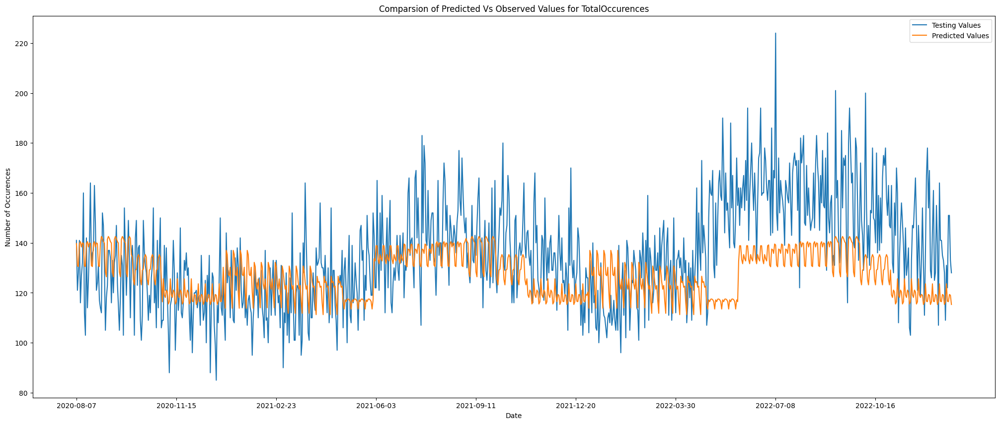

In [ ]:
#========= Random Forest Regressor ============
# Build Regressor
rfr_regressor = create_rfr(X_train,y_train)

# Make Predictions
y_predict = rfr_regressor.predict(X_Test)

# Print metrics
print("Mean Squared Error:", round(mean_squared_error(y_test, y_predict), 4))
print("Mean Absolute Error:", round(mean_absolute_error(y_test, y_predict), 4))

# Plot the predictions versus the observed values
plt.figure(figsize=(25,10))
plt.plot(x_ticks, y_test,label='Testing Values')
plt.plot(x_ticks, y_predict,label='Predicted Values')
plt.xticks(x_ticks[::100])
plt.xlabel("Date")
plt.ylabel("Number of Occurences")
plt.title("Comparsion of Predicted Vs Observed Values for {}".format(target))
plt.legend()


Best Parameters:  {'subsample': 0.8, 'n_estimators': 50, 'min_samples_split': 8, 'min_samples_leaf': 9, 'max_depth': 5, 'learning_rate': 0.75}
Mean Squared Error: 511.1765
Mean Absolute Error: 17.8205


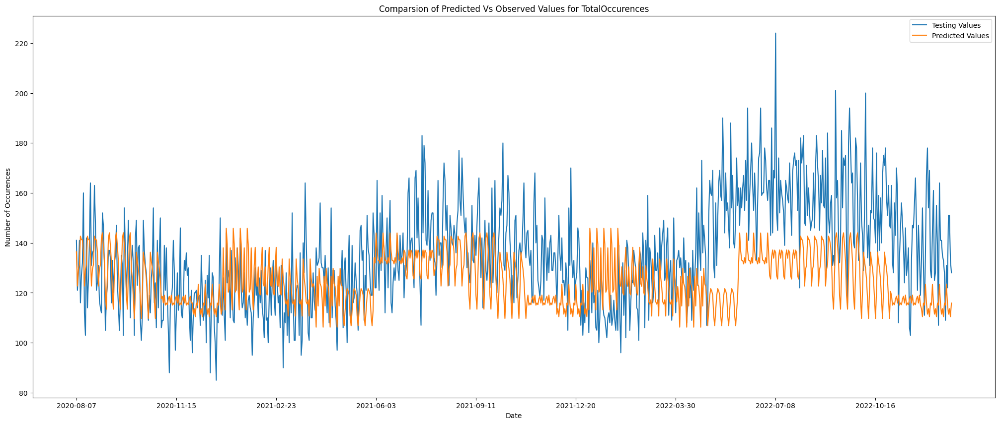

In [ ]:
#========= GradientBoostingRegressor ============
# Search Params
gbr_regressor = create_gbr(X_train,y_train)

# Make Predictions
y_predict = gbr_regressor.predict(X_Test)

# Print metrics
print("Mean Squared Error:", round(mean_squared_error(y_test, y_predict), 4))
print("Mean Absolute Error:", round(mean_absolute_error(y_test, y_predict), 4))

# Plot the predictions versus the observed values
plt.figure(figsize=(25,10))
plt.plot(x_ticks, y_test,label='Testing Values')
plt.plot(x_ticks, y_predict,label='Predicted Values')
plt.xticks(x_ticks[::100])
plt.xlabel("Date")
plt.ylabel("Number of Occurences")
plt.title("Comparsion of Predicted Vs Observed Values for {}".format(target))
plt.legend()

Best Parameters:  {'n_estimators': 25, 'learning_rate': 0.25}
Mean Squared Error: 438.3887
Mean Absolute Error: 16.1677


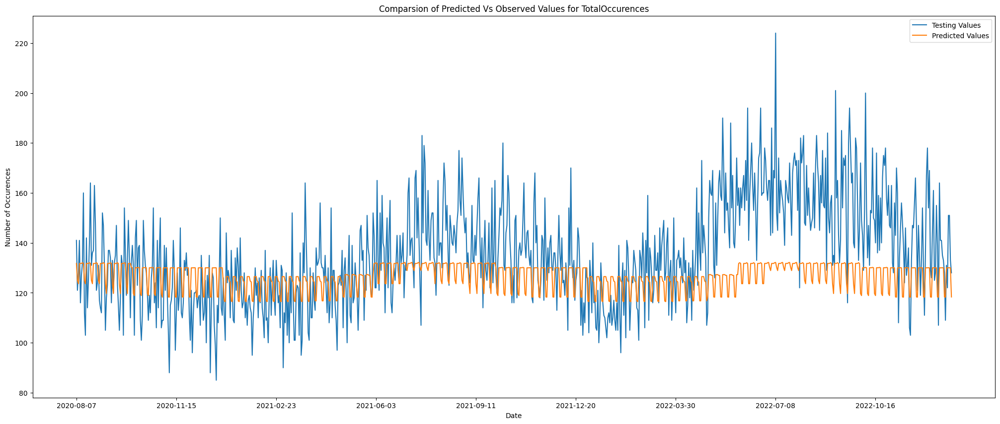

In [ ]:
#========= AdaBoostRegressor ============
# Search Params
abr_regressor = create_abr(X_train,y_train)

# Make Predictions
y_predict = abr_regressor.predict(X_Test)

# Print metrics
print("Mean Squared Error:", round(mean_squared_error(y_test, y_predict), 4))
print("Mean Absolute Error:", round(mean_absolute_error(y_test, y_predict), 4))

# Plot the predictions versus the observed values
plt.figure(figsize=(25,10))
plt.plot(x_ticks, y_test,label='Testing Values')
plt.plot(x_ticks, y_predict,label='Predicted Values')
plt.xticks(x_ticks[::100])
plt.xlabel("Date")
plt.ylabel("Number of Occurences")
plt.title("Comparsion of Predicted Vs Observed Values for {}".format(target))
plt.legend()

Best Parameters:  {'n_estimators': 150, 'min_samples_split': 9, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'max_depth': None}
Mean Squared Error: 419.4308
Mean Absolute Error: 15.9287


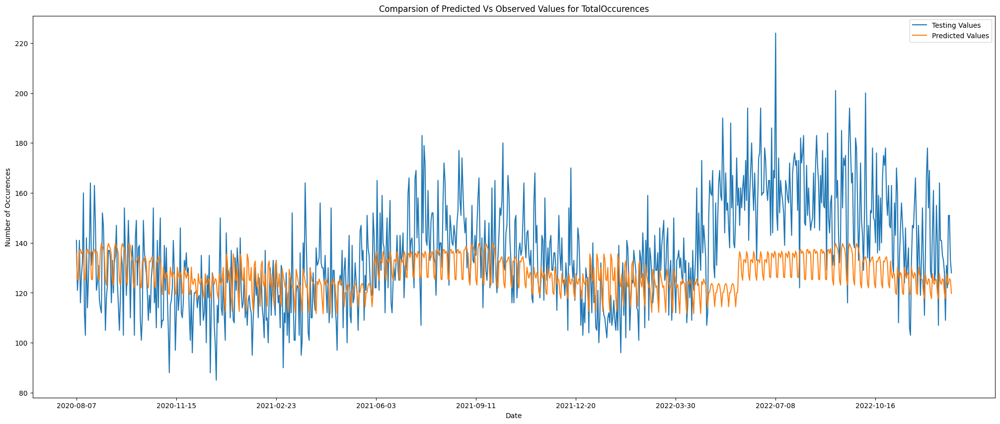

In [ ]:
#========= Extra Trees Regressor ============
# Build The Regressor
etr_regressor = create_etr(X_train,y_train)

# Make Predictions
y_predict = etr_regressor.predict(X_Test)

# Print metrics
print("Mean Squared Error:", round(mean_squared_error(y_test, y_predict), 4))
print("Mean Absolute Error:", round(mean_absolute_error(y_test, y_predict), 4))

# Plot the predictions versus the observed values
plt.figure(figsize=(25,10))
plt.plot(x_ticks, y_test,label='Testing Values')
plt.plot(x_ticks, y_predict,label='Predicted Values')
plt.xticks(x_ticks[::100])
plt.xlabel("Date")
plt.ylabel("Number of Occurences")
plt.title("Comparsion of Predicted Vs Observed Values for {}".format(target))
plt.legend()

Explore The Regressor Performance on the DA Clusters

In [ ]:
# Train Regressors by grouping the dissemination areas by their clusters from before
for cluster_id in range(4):
  print("Cluster ID: {}".format(cluster_id))
  dauids = dauid_clusters[cluster_id]
  dArea = dOccurrences.loc[dOccurrences['dissemination_area'].isin(dauids)]

  dValueCounts = dArea.groupby('ReportedDate')['CallGrouping'].value_counts().unstack(fill_value=0)
  dValueCounts['TotalOccurences'] = dValueCounts.sum(axis=1)

  # Make the dataframe for the model
  dModel = dValueCounts.reset_index()
  dModel['Year'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").year)
  dModel['Month'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").month)
  dModel['Weekday'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").weekday())
  dModel['Date'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x,"%Y-%m-%d"))
  dModel['is_weekend'] = (dModel['Date'].dt.dayofweek >= 5).astype(int)

  # Pick a CallGroup
  target = 'TotalOccurences'
  #features = [x for x in dModel.columns if x not in[target, 'ReportedDate']]
  features = ['Year','Month','Weekday','is_weekend']

  #Get Training Data
  training_data = dModel.iloc[:int(0.8*dModel.shape[0])]
  X_train = training_data[features]
  y_train = training_data[target]

  # Get the testing data
  testing_data = dModel.iloc[int(0.8*dModel.shape[0]):]
  X_test = testing_data[features]
  y_test = testing_data[target]
  x_ticks = dModel['ReportedDate'].iloc[int(0.8*dModel.shape[0]):]

  #========= Train and Evalaute the Regressors =====
  regressors = {
      'RandomForest': create_rfr(X_train,y_train),
      'GradientBoost': create_gbr(X_train,y_train),
      'AdaBoost': create_abr(X_train,y_train),
      'ExtraTrees': create_etr(X_train,y_train)
  }

  for reg in regressors.keys():
    y_predict = regressors[reg].predict(X_test)
    print(reg, "---- Mean Squared Error:", round(mean_squared_error(y_test, y_predict), 4))


Cluster ID: 0
Best Parameters:  {'n_estimators': 200, 'min_samples_split': 3, 'min_samples_leaf': 7}
Best Parameters:  {'subsample': 0.7, 'n_estimators': 100, 'min_samples_split': 4, 'min_samples_leaf': 7, 'max_depth': 9, 'learning_rate': 0.25}
Best Parameters:  {'n_estimators': 25, 'learning_rate': 0.25}
Best Parameters:  {'n_estimators': 50, 'min_samples_split': 4, 'min_samples_leaf': 5, 'max_features': 'log2', 'max_depth': 8}
RandomForest ---- Mean Squared Error: 118.1152
GradientBoost ---- Mean Squared Error: 138.8124
AdaBoost ---- Mean Squared Error: 113.1656
ExtraTrees ---- Mean Squared Error: 123.4834
Cluster ID: 1
Best Parameters:  {'n_estimators': 125, 'min_samples_split': 10, 'min_samples_leaf': 9}
Best Parameters:  {'subsample': 0.8, 'n_estimators': 70, 'min_samples_split': 10, 'min_samples_leaf': 7, 'max_depth': 2, 'learning_rate': 1.75}
Best Parameters:  {'n_estimators': 10, 'learning_rate': 0.25}
Best Parameters:  {'n_estimators': 25, 'min_samples_split': 7, 'min_samples_

Best Parameters:  {'n_estimators': 2, 'learning_rate': 0.75}
Mean Squared Error: 8.0997
Mean Absolute Error: 2.1769


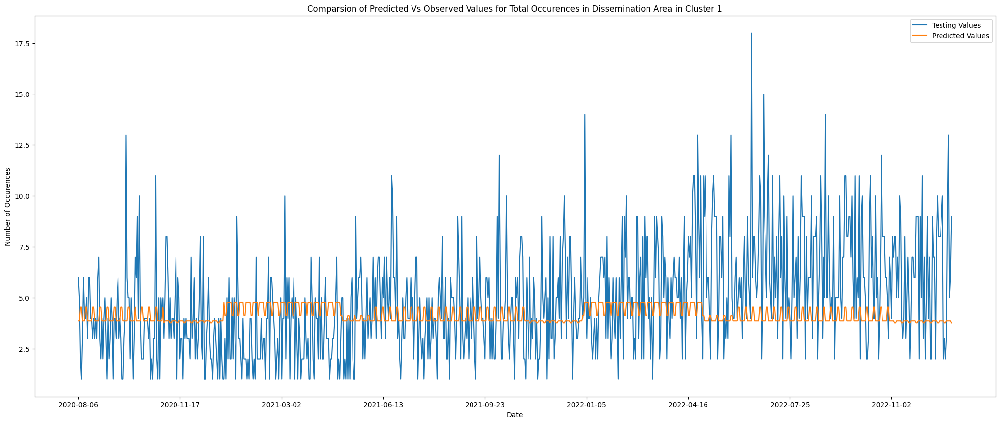

In [ ]:
#========= Train a Specific Regressor on a set of DA ============
cluster_id=1
dauids = dauid_clusters[cluster_id]
dArea = dOccurrences.loc[dOccurrences['dissemination_area'].isin(dauids)]

dValueCounts = dArea.groupby('ReportedDate')['CallGrouping'].value_counts().unstack(fill_value=0)
dValueCounts['TotalOccurences'] = dValueCounts.sum(axis=1)

# Make the dataframe for the model
dModel = dValueCounts.reset_index()
dModel['Year'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").year)
dModel['Month'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").month)
dModel['Weekday'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").weekday())
dModel['Date'] = dModel['ReportedDate'].apply(lambda x: datetime.strptime(x,"%Y-%m-%d"))
dModel['is_weekend'] = (dModel['Date'].dt.dayofweek >= 5).astype(int)

# Pick a CallGroup
target = 'TotalOccurences'
#features = [x for x in dModel.columns if x not in[target, 'ReportedDate']]
features = ['Year','Month','Weekday','is_weekend']

#Get Training Data
training_data = dModel.iloc[:int(0.8*dModel.shape[0])]
X_train = training_data[features]
y_train = training_data[target]

# Get the testing data
testing_data = dModel.iloc[int(0.8*dModel.shape[0]):]
X_test = testing_data[features]
y_test = testing_data[target]
x_ticks = dModel['ReportedDate'].iloc[int(0.8*dModel.shape[0]):]

# Make Predictions
y_predict = create_abr(X_train,y_train).predict(X_test)

# Print metrics
print("Mean Squared Error:", round(mean_squared_error(y_test, y_predict), 4))
print("Mean Absolute Error:", round(mean_absolute_error(y_test, y_predict), 4))

# Plot the predictions versus the observed values
plt.figure(figsize=(25,10))
plt.plot(x_ticks, y_test,label='Testing Values')
plt.plot(x_ticks, y_predict,label='Predicted Values')
plt.xticks(x_ticks[::100])
plt.xlabel("Date")
plt.ylabel("Number of Occurences")
plt.title("Comparsion of Predicted Vs Observed Values for Total Occurences in Dissemination Area in Cluster {}".format(cluster_id))
plt.legend()

Explore regressor performance on smoothed data at a weekly level

In [ ]:
#Regression Predictions for Total Number of Occurrences
#Evaluate three possible regression models to make predictions; Random Forest, AdaBoost, and Gradient Boosting

dValueCounts = dOccurrences.groupby('ReportedDate')['CallGrouping'].value_counts().unstack(fill_value=0)
dValueCounts['TotalOccurences'] = dValueCounts.sum(axis=1)

# Make the dataframe for the model
dMovingAverage = dValueCounts.reset_index()
dMovingAverage['Year'] = dMovingAverage['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").year)
dMovingAverage['Month'] = dMovingAverage['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").month)
dMovingAverage['Weekday'] = dMovingAverage['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").weekday())
dMovingAverage['Date'] = dMovingAverage['ReportedDate'].apply(lambda x: datetime.strptime(x,"%Y-%m-%d"))
dMovingAverage['is_weekend'] = (dMovingAverage['Date'].dt.dayofweek >= 5).astype(int)
dMovingAverage = dMovingAverage[['Date','Year','Month','Weekday','is_weekend', 'TotalOccurences']]

# Do a moving average of 1 week, seven days
window_size=7
dMovingAverage['MovingAverage'] = dMovingAverage['TotalOccurences'].rolling(window=window_size).mean()

# Reset the dataframe since we will not have data for the first set of days in the rolling average window
dMovingAverage = dMovingAverage.iloc[window_size:]
dMovingAverage.reset_index(drop=True,inplace=True)
dMovingAverage.head()

<ipython-input-69-b03817d9ec0b>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dMovingAverage['MovingAverage'] = dMovingAverage['TotalOccurences'].rolling(window=window_size).mean()


CallGrouping,Date,Year,Month,Weekday,is_weekend,TotalOccurences,MovingAverage
0,2011-01-08,2011,1,5,1,109,92.000000
1,2011-01-09,2011,1,6,1,83,93.857143
2,2011-01-10,2011,1,0,0,84,91.857143
3,2011-01-11,2011,1,1,0,68,89.142857
4,2011-01-12,2011,1,2,0,74,89.142857


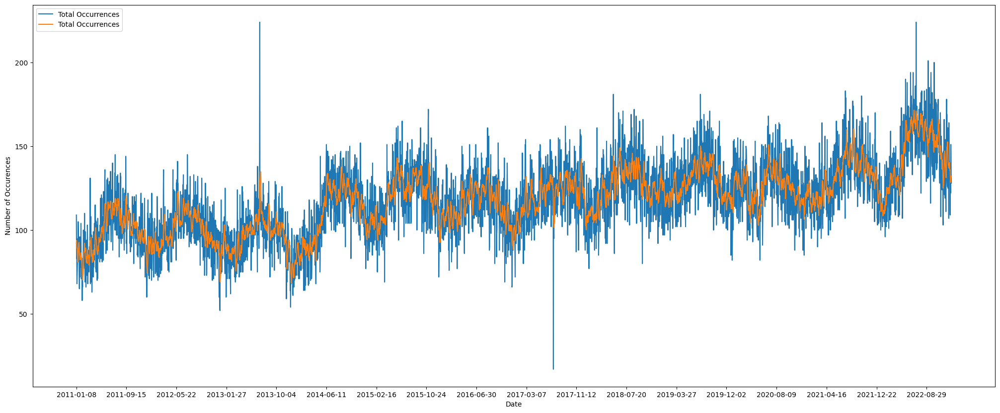

In [ ]:
# Plot the moving average against the total number of occurrences
plt.figure(figsize=(25,10))
plt.plot(dMovingAverage['Date'], dMovingAverage['TotalOccurences'],label='Total Occurrences')
plt.plot(dMovingAverage['Date'], dMovingAverage['MovingAverage'],label='Total Occurrences')
plt.xticks(dMovingAverage['Date'][::250])
plt.xlabel("Date")
plt.ylabel("Number of Occurences")
plt.legend()
plt.show()

In [ ]:
# Run the Regressors on the Moving Average
target = 'MovingAverage'
features = ['Year','Month','Weekday','is_weekend']

#Get Training Data
training_data = dMovingAverage.iloc[:int(0.8*dMovingAverage.shape[0])]
X_train = training_data[features]
y_train = training_data[target]

# Get the testing data
testing_data = dMovingAverage.iloc[int(0.8*dMovingAverage.shape[0]):]
X_test = testing_data[features]
y_test = testing_data[target]
x_ticks = dMovingAverage['Date'].iloc[int(0.8*dMovingAverage.shape[0]):]

#========= Train and Evalaute the Regressors =====
regressors = {
    'RandomForest': create_rfr(X_train,y_train),
    'GradientBoost': create_gbr(X_train,y_train),
    'AdaBoost': create_abr(X_train,y_train),
    'ExtraTrees': create_etr(X_train,y_train)
    }

for reg in regressors.keys():
  y_predict = regressors[reg].predict(X_test)
  print(reg)
  print("---- Mean Squared Error:", round(mean_squared_error(y_test, y_predict), 4))
  print("---- Mean Absolute Error:", round(mean_absolute_error(y_test, y_predict), 4))

Best Parameters:  {'n_estimators': 200, 'min_samples_split': 9, 'min_samples_leaf': 7}
Best Parameters:  {'subsample': 0.6, 'n_estimators': 10, 'min_samples_split': 9, 'min_samples_leaf': 2, 'max_depth': 2, 'learning_rate': 1.0}
Best Parameters:  {'n_estimators': 50, 'learning_rate': 2.25}
Best Parameters:  {'n_estimators': 150, 'min_samples_split': 10, 'min_samples_leaf': 9, 'max_features': 'sqrt', 'max_depth': 10}
RandomForest
---- Mean Squared Error: 268.4871
---- Mean Absolute Error: 12.9069
GradientBoost
---- Mean Squared Error: 209.8878
---- Mean Absolute Error: 11.2965
AdaBoost
---- Mean Squared Error: 273.2766
---- Mean Absolute Error: 12.4406
ExtraTrees
---- Mean Squared Error: 249.8167
---- Mean Absolute Error: 12.1949


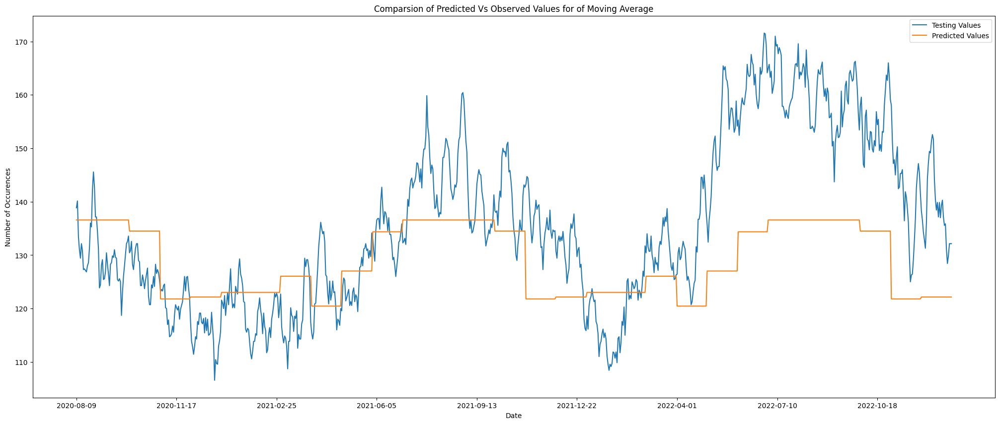

In [ ]:
#== Build a Regressor and Compare against Observed Moving Average
# Make Predictions
best_regressor='GradientBoost'
y_predict = regressors[best_regressor].predict(X_test)

# Plot the predictions versus the observed values
plt.figure(figsize=(25,10))
plt.plot(x_ticks, y_test,label='Testing Values')
plt.plot(x_ticks, y_predict,label='Predicted Values')
plt.xticks(x_ticks[::100])
plt.xlabel("Date")
plt.ylabel("Number of Occurences")
plt.title("Comparsion of Predicted Vs Observed Values for of Moving Average")
plt.legend()

Let's explore the performance when we look at it from a monthly/every four weeks

<ipython-input-74-e880a8034255>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dMovingAverage['MovingAverage'] = dMovingAverage['TotalOccurences'].rolling(window=window_size).mean()


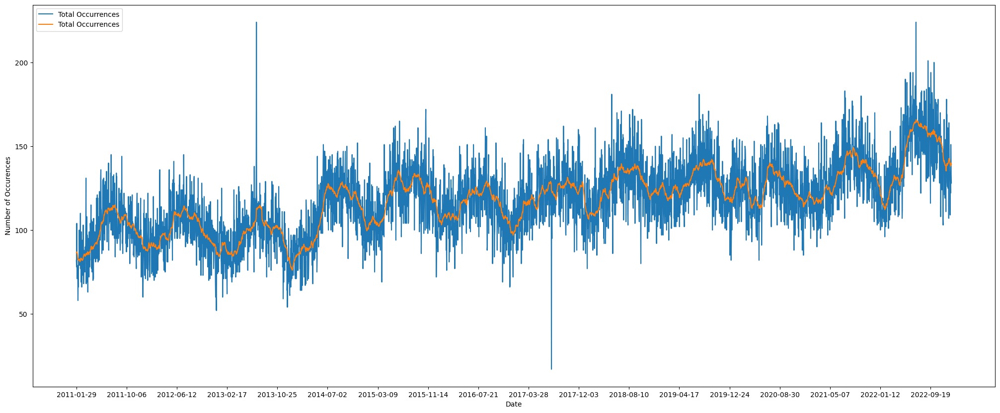

In [ ]:
#Regression Predictions for Total Number of Occurrences
#Evaluate three possible regression models to make predictions; Random Forest, AdaBoost, and Gradient Boosting

dValueCounts = dOccurrences.groupby('ReportedDate')['CallGrouping'].value_counts().unstack(fill_value=0)
dValueCounts['TotalOccurences'] = dValueCounts.sum(axis=1)

# Make the dataframe for the model
dMovingAverage = dValueCounts.reset_index()
dMovingAverage['Year'] = dMovingAverage['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").year)
dMovingAverage['Month'] = dMovingAverage['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").month)
dMovingAverage['Weekday'] = dMovingAverage['ReportedDate'].apply(lambda x: datetime.strptime(x, "%Y-%m-%d").weekday())
dMovingAverage['Date'] = dMovingAverage['ReportedDate'].apply(lambda x: datetime.strptime(x,"%Y-%m-%d"))
dMovingAverage['is_weekend'] = (dMovingAverage['Date'].dt.dayofweek >= 5).astype(int)
dMovingAverage = dMovingAverage[['Date','Year','Month','Weekday','is_weekend', 'TotalOccurences']]

# Do a moving average of 1 week, seven days
window_size=28
dMovingAverage['MovingAverage'] = dMovingAverage['TotalOccurences'].rolling(window=window_size).mean()

# Reset the dataframe since we will not have data for the first set of days in the rolling average window
dMovingAverage = dMovingAverage.iloc[window_size:]
dMovingAverage.reset_index(drop=True,inplace=True)

# Plot the moving average against the total number of occurrences
plt.figure(figsize=(25,10))
plt.plot(dMovingAverage['Date'], dMovingAverage['TotalOccurences'],label='Total Occurrences')
plt.plot(dMovingAverage['Date'], dMovingAverage['MovingAverage'],label='Total Occurrences')
plt.xticks(dMovingAverage['Date'][::250])
plt.xlabel("Date")
plt.ylabel("Number of Occurences")
plt.legend()
plt.show()

In [ ]:
# Run the Regressors on the Moving Average
target = 'MovingAverage'
features = ['Year','Month','Weekday','is_weekend']

#Get Training Data
training_data = dMovingAverage.iloc[:int(0.8*dMovingAverage.shape[0])]
X_train = training_data[features]
y_train = training_data[target]

# Get the testing data
testing_data = dMovingAverage.iloc[int(0.8*dMovingAverage.shape[0]):]
X_test = testing_data[features]
y_test = testing_data[target]
x_ticks = dMovingAverage['Date'].iloc[int(0.8*dMovingAverage.shape[0]):]

#========= Train and Evalaute the Regressors =====
regressors = {
    'RandomForest': create_rfr(X_train,y_train),
    'GradientBoost': create_gbr(X_train,y_train),
    'AdaBoost': create_abr(X_train,y_train),
    'ExtraTrees': create_etr(X_train,y_train)
    }

for reg in regressors.keys():
  y_predict = regressors[reg].predict(X_test)
  print(reg)
  print("---- Mean Squared Error:", round(mean_squared_error(y_test, y_predict), 4))
  print("---- Mean Absolute Error:", round(mean_absolute_error(y_test, y_predict), 4))

Best Parameters:  {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1}
Best Parameters:  {'subsample': 0.4, 'n_estimators': 50, 'min_samples_split': 8, 'min_samples_leaf': 4, 'max_depth': 8, 'learning_rate': 0.75}
Best Parameters:  {'n_estimators': 50, 'learning_rate': 1.25}
Best Parameters:  {'n_estimators': 70, 'min_samples_split': 7, 'min_samples_leaf': 7, 'max_features': 'sqrt', 'max_depth': 10}
RandomForest
---- Mean Squared Error: 242.5643
---- Mean Absolute Error: 12.3916
GradientBoost
---- Mean Squared Error: 275.7625
---- Mean Absolute Error: 13.1188
AdaBoost
---- Mean Squared Error: 247.1851
---- Mean Absolute Error: 11.8673
ExtraTrees
---- Mean Squared Error: 221.3952
---- Mean Absolute Error: 11.6437


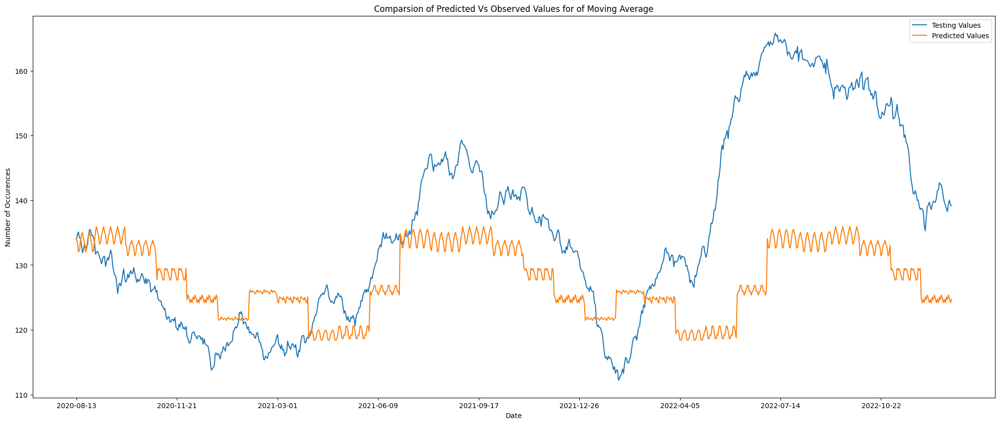

In [ ]:
#== Build a Regressor and Compare against Observed Moving Average
# Make Predictions
best_regressor='ExtraTrees'
y_predict = regressors[best_regressor].predict(X_test)

# Plot the predictions versus the observed values
plt.figure(figsize=(25,10))
plt.plot(x_ticks, y_test,label='Testing Values')
plt.plot(x_ticks, y_predict,label='Predicted Values')
plt.xticks(x_ticks[::100])
plt.xlabel("Date")
plt.ylabel("Number of Occurences")
plt.title("Comparsion of Predicted Vs Observed Values for of Moving Average")
plt.legend()

In [11]:
#Adding something here PF


In [12]:
#Import section (will integrate to top once done)
import pandas as pd
from shapely import wkt
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
import folium
import geopandas as gpd


import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from folium.features import GeoJsonPopup
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_text

from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [13]:
df = pd.read_csv('/content/drive/MyDrive/Group 3 Machine Learning/Project Files/Data/Outputs/WaterlooRegionIncidentDatawith_Dissemination_area_and_block.csv')



<ipython-input-13-46d4bac11cbd>:1: DtypeWarning: Columns (4,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/drive/MyDrive/Group 3 Machine Learning/Project Files/Data/Outputs/WaterlooRegionIncidentDatawith_Dissemination_area_and_block.csv')


In [14]:

df = df[(df['dissemination_block'] != 0) & (~df['dissemination_block'].isna())]
df.reset_index(drop=True, inplace=True)


In [15]:
#Clean dissemination block data in the occurrence Data set
#Not Needed
#df['dissemination_block'] = df['dissemination_block'].astype('int64')
# df['dissemination_block'] = df['dissemination_block'].replace('nan', '0')
# df['dissemination_block'] = df['dissemination_block'].fillna(0).astype(str).str.split('.').str[0].astype('int64')
# df['dissemination_area'] = df['dissemination_area'].fillna(0).astype(str).str.split('.').str[0].astype('int64')
#df['dissemination_block'] = df['dissemination_block'].astype(str)

In [16]:
df_Columnscleared = df.copy()
df_Columnscleared = df_Columnscleared.dropna(subset=['CallGrouping'])
df_Columnscleared['ReportedDateandTime'] = pd.to_datetime(df_Columnscleared['ReportedDateandTime'])
df_Columnscleared =df_Columnscleared.dropna(subset=['TotalUnitServiceTime'])
#Add a number to the set should have been added at the data load
df_Columnscleared['Week'] = df_Columnscleared['ReportedDateandTime'].dt.isocalendar().week


In [17]:
#Create a frame for each Type
BreakandEnter_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Break and Enter'].copy()

DomesticViolence_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Domestic Violence'].copy()

PublicSafety_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Public Safety'].copy()
SocialDisorder_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Social Disorder'].copy()
TheftUnder_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Theft Under (shoplifting)'].copy()
OffenceagainstPerson_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Offence Against Person'].copy()
MentalHealth_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Mental Health'].copy()
AutoTheft_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Auto Theft'].copy()

Fraud_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Fraud'].copy()
Robbery_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Robbery'].copy()
TheftOver_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Theft Over'].copy()
HumanTrafficking_df = df_Columnscleared[df_Columnscleared['CallGrouping'] == 'Human Trafficking'].copy()

In [18]:
file_path = '/content/drive/MyDrive/Group 3 Machine Learning/Project Files/Data/Outputs/Waterloo_region_dissemination_data_with_geoshapes.csv'
Waterloo_region_CensusData_Dissemination_Areas_df = pd.read_csv(file_path)

Waterloo_region_CensusData_Dissemination_Areas_df['geometry'] = Waterloo_region_CensusData_Dissemination_Areas_df['geometry'].apply(wkt.loads)
display(Waterloo_region_CensusData_Dissemination_Areas_df)

,ALT_GEO_CODE,Bosnian,Croatian,Dari,Iranian Persian,Odia,"Oriya, n.o.s.","Persian (Farsi), n.o.s.",Serbian,"Serbo-Croatian, n.i.e.",...,Total - Total income groups in 2020 for the population aged 15 years and over in private households - 100% data,Total - Visible minority for the population in private households - 25% sample data,Total number of census families in private households - 100% data,Total private dwellings,Unemployment rate,DAUID,DGUID,LANDAREA,PRUID,geometry
0,35300002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1080.0,1430.0,430.0,520.0,3.4,35300002,2021S051235300002,6.8791,35,"POLYGON ((7130600.254285753 906514.245714318, ..."
1,35300003,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,350.0,380.0,105.0,221.0,12.5,35300003,2021S051235300003,0.1718,35,"POLYGON ((7130434.034285754 905079.9228571765,..."
2,35300004,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,355.0,425.0,130.0,176.0,4.3,35300004,2021S051235300004,0.1520,35,"POLYGON ((7130302.528571472 904055.2085714638,..."
3,35300005,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,365.0,395.0,100.0,228.0,0.0,35300005,2021S051235300005,0.1689,35,"POLYGON ((7130853.342857182 904398.754285749, ..."
4,35300006,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,285.0,380.0,100.0,140.0,0.0,35300006,2021S051235300006,0.1827,35,"POLYGON ((7130520.397142895 903777.9342857487,..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
730,35301055,0.0,10.0,25.0,10.0,0.0,0.0,0.0,35.0,0.0,...,1085.0,1365.0,380.0,494.0,9.7,35301055,2021S051235301055,0.6225,35,"POLYGON ((7137447.482857183 884163.4742857479,..."
731,35301056,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,265.0,60.0,84.0,18.8,35301056,2021S051235301056,0.0481,35,"POLYGON ((7142396.860000044 886192.322857175, ..."
732,35301057,0.0,35.0,65.0,40.0,0.0,0.0,10.0,105.0,0.0,...,2090.0,2390.0,555.0,1002.0,7.0,35301057,2021S051235301057,0.5205,35,"POLYGON ((7143818.377142899 886471.8200000338,..."
733,35301059,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,15.0,19.0,0.0,35301059,2021S051235301059,5.9928,35,"POLYGON ((7140558.605714329 881276.6228571758,..."


In [19]:
#Load the proximity set
file_path = '/content/drive/MyDrive/Group 3 Machine Learning/Project Files/Data/Outputs/Waterloo_region_proximity_withGeography_df.csv'
Waterloo_region_proximity_withGeography_df = pd.read_csv(file_path)
#NOTE this is important to get the shapes mapping correctly
Waterloo_region_proximity_withGeography_df['geometry'] = Waterloo_region_proximity_withGeography_df['geometry'].apply(wkt.loads)
#display(Waterloo_region_proximity_withGeography_df)
#Clean up the data to ensure everything has a value and make sure they are ints
#Note Amenity dense is a category field 0 indicating not in the dissemination block and 1 means present , presumably 2 means multiplebut this was not clearly defined in the documenatation
Waterloo_region_proximity_withGeography_df['prox_idx_pharma'] = pd.to_numeric(Waterloo_region_proximity_withGeography_df['prox_idx_pharma'], errors='coerce')
Waterloo_region_proximity_withGeography_df['prox_idx_childcare'] = pd.to_numeric(Waterloo_region_proximity_withGeography_df['prox_idx_childcare'], errors='coerce')
Waterloo_region_proximity_withGeography_df['prox_idx_health'] = pd.to_numeric(Waterloo_region_proximity_withGeography_df['prox_idx_health'], errors='coerce')
Waterloo_region_proximity_withGeography_df['prox_idx_grocery'] = pd.to_numeric(Waterloo_region_proximity_withGeography_df['prox_idx_grocery'], errors='coerce')
Waterloo_region_proximity_withGeography_df['prox_idx_lib'] = pd.to_numeric(Waterloo_region_proximity_withGeography_df['prox_idx_lib'], errors='coerce')
Waterloo_region_proximity_withGeography_df['prox_idx_parks'] = pd.to_numeric(Waterloo_region_proximity_withGeography_df['prox_idx_parks'], errors='coerce')
Waterloo_region_proximity_withGeography_df['prox_idx_transit'] = pd.to_numeric(Waterloo_region_proximity_withGeography_df['prox_idx_transit'], errors='coerce')
Waterloo_region_proximity_withGeography_df['prox_idx_emp'] = pd.to_numeric(Waterloo_region_proximity_withGeography_df['prox_idx_emp'], errors='coerce')


Waterloo_region_proximity_withGeography_df['amenity_dense'] = pd.to_numeric(Waterloo_region_proximity_withGeography_df['amenity_dense'], errors='coerce')
Waterloo_region_proximity_withGeography_df['prox_idx_pharma'].fillna(0, inplace=True)
Waterloo_region_proximity_withGeography_df['prox_idx_childcare'].fillna(0, inplace=True)
Waterloo_region_proximity_withGeography_df['prox_idx_health'].fillna(0, inplace=True)
Waterloo_region_proximity_withGeography_df['prox_idx_grocery'].fillna(0, inplace=True)
Waterloo_region_proximity_withGeography_df['prox_idx_lib'].fillna(0, inplace=True)
Waterloo_region_proximity_withGeography_df['prox_idx_parks'].fillna(0, inplace=True)
Waterloo_region_proximity_withGeography_df['prox_idx_transit'].fillna(0, inplace=True)
Waterloo_region_proximity_withGeography_df['prox_idx_emp'].fillna(0, inplace=True)
Waterloo_region_proximity_withGeography_df['amenity_dense'].fillna(0, inplace=True )

#display(Waterloo_region_proximity_withGeography_df)

Creating a function now so we can throw each dataset at it and evaluate the outcomes based on a variety of hyper parameters

In [20]:
census_columns_selected = ['DAUID', 'DGUID', 'LANDAREA', 'PRUID', 'geometry','Population, 2021','Population, 2016','Total private dwellings'
                     ,'Median total income in 2020 among recipients ($)','Median after-tax income in 2020 among recipients ($)','Without total income'
                    ,'Median total income of household in 2020 ($)'
                    ,'Population density per square kilometre'
                     ,'Owner','Renter'
                    ,'Total visible minority population','Not a visible minority'
                    ,'No high school diploma or equivalency certificate','With high school diploma or equivalency certificate'
                    ,'No certificate, diploma or degree','High (secondary) school diploma or equivalency certificate','Postsecondary certificate, diploma or degree'
                    ,'Employed','Unemployed','Employment rate','Unemployment rate'
                    ]

def process_dataframe(Callgrouping_df):
    import pandas as pd

    CallGroupingName = Callgrouping_df.iloc[0]['CallGrouping']
    #Make sure there are no null values in x and y coordinates
    display(CallGroupingName)
    #display(Callgrouping_df)
    Callgrouping_df_not_null = Callgrouping_df[Callgrouping_df['x_cord'].notnull() & Callgrouping_df['y_cord'].notnull()].copy()
    Callgrouping_df_not_null['Hour'] = Callgrouping_df_not_null['ReportedDateandTime'].dt.hour
    Callgrouping_df_not_null['Day_of_Week'] = Callgrouping_df_not_null['ReportedDateandTime'].dt.dayofweek


    Census_data_bydisseminationarea_selectedcolumns_only_df = Waterloo_region_CensusData_Dissemination_Areas_df[census_columns_selected].copy()

    Callgrouping_with_proximity_df_not_null = pd.merge( Callgrouping_df_not_null, Waterloo_region_proximity_withGeography_df, left_on='dissemination_block', right_on='DBUID', how='inner')

    Callgrouping_with_proximity_Census_df_not_null = pd.merge(Callgrouping_with_proximity_df_not_null, Census_data_bydisseminationarea_selectedcolumns_only_df, left_on='dissemination_area', right_on='DAUID', how='inner')
    # display(Callgrouping_with_proximity_Census_df_not_null)
#     #check for the columns
#     for column in Callgrouping_with_proximity_Census_df_not_null.columns:
#         print(column)

    #columns_to_test , should i send these in with parameters? For now yes
    columns_to_test = ["occurrencefileno",
                   #,'ReportedDateandTime','CallGrouping',
                   #these are the targets(preferably block)
                    'dissemination_block'
                    #,'dissemination_area'
                    ,'Year','Month','Hour','Day_of_Week'
                    #,'Week'
                       #,'DBPOP','DAPOP'
                   ,'Population density per square kilometre'
                   ,'prox_idx_emp','prox_idx_pharma','prox_idx_childcare','prox_idx_health','prox_idx_grocery','prox_idx_educpri','prox_idx_educsec','prox_idx_transit','prox_idx_parks','prox_idx_lib','Population, 2021','Population, 2016','Total private dwellings','Median total income in 2020 among recipients ($)'
                   ,'Median total income of household in 2020 ($)'
                   ,'Owner','Renter'
                   ,'Employment rate','Unemployment rate'
#                     Categorical columns
                   ,'in_db_emp','in_db_pharma','in_db_childcare','in_db_health','in_db_grocery','in_db_educpri','in_db_educsec','in_db_lib','in_db_parks','in_db_transit','amenity_dense'
                  ]

    Callgrouping_with_proximity_Census_df_not_null.replace('..', 0, inplace=True)
    Callgrouping_prep_df= Callgrouping_with_proximity_Census_df_not_null[columns_to_test]

    numerical_columns = [#'Year',
                         'Month'
                         #,'Week'
                         ,'Hour','Day_of_Week'
                         #,'DBPOP','DAPOP'
                         ,'Population density per square kilometre','prox_idx_emp','prox_idx_pharma','prox_idx_childcare','prox_idx_health','prox_idx_grocery','prox_idx_educpri','prox_idx_educsec','prox_idx_transit','prox_idx_parks','prox_idx_lib','Population, 2021','Population, 2016','Total private dwellings','Median total income in 2020 among recipients ($)','Median total income of household in 2020 ($)','Owner','Renter'
                    ,'Employment rate','Unemployment rate']
    categorical_columns = ['in_db_emp','in_db_pharma','in_db_childcare','in_db_health','in_db_grocery','in_db_educpri','in_db_educsec','in_db_lib','in_db_parks','in_db_transit','amenity_dense']
    #note this could be changed to dissemination_area but i felt the smaller blocks were more insightful
    target_variable= 'dissemination_block'

    #I need to split the data on 2021-2022 as test set and before as the train set
    Callgroupingtest_set = Callgrouping_prep_df[Callgrouping_prep_df['Year'] >= 2021]
    Callgroupingtrain_set = Callgrouping_prep_df[Callgrouping_prep_df['Year'] < 2021]

    #get the variables ready to process
    y_Callgroupingtest_set = Callgroupingtest_set[target_variable]
    X_Callgroupingtest_set = Callgroupingtest_set.drop(columns=[target_variable,'occurrencefileno'])

    y_Callgroupingtrain_set = Callgroupingtrain_set[target_variable]
    X_Callgroupingtrain_set = Callgroupingtrain_set.drop(columns=[target_variable,'occurrencefileno'])

# Originally I scaled this but I have since discovered that it was unecessary and didnt change anything for this classifier
#     #Scale the columns for both test and train
#     category_pipeline =Pipeline([('onehot',OneHotEncoder(handle_unknown="ignore")),])
#     numerical_pipeline = Pipeline([('scaler',MinMaxScaler(feature_range=(0,1))),])

#     full_pipeline = ColumnTransformer([
#         ("categorical",category_pipeline,categorical_columns),
#         ("numerical",numerical_pipeline,numerical_columns)
#     ])
#     #display(full_pipeline)
#     full_pipeline.fit(X_Callgroupingtrain_set)
#     X_Callgroupingtrain_transformed = full_pipeline.transform(X_Callgroupingtrain_set)
#     X_Callgroupingtest_transformed = full_pipeline.transform(X_Callgroupingtest_set)
#     #trying without scaling
    X_Callgroupingtrain_transformed = X_Callgroupingtrain_set
    X_Callgroupingtest_transformed = X_Callgroupingtest_set

    # Define the hyperparameters to test I am going to parameterize these later
    #Note the more you add it adds significantly more time
    max_depths = [2,5,9,12,15,20]  # None is unlimited #, 15, 20,25
    criteria = ['entropy','gini']
    #turned off 'gini' as it wasnt as good
    # Initialize an empty df
    Classifieriterations_results_df = pd.DataFrame(columns=['CallGrouping','Max_Depth', 'Criterion', 'Accuracy','Predictions','tree_text','correct_predictions','incorrect_predictions'])

    # Loop over hyper parameters
    for max_depth in max_depths:
        for criterion in criteria:
            # Initialize and train the Decision Tree Classifier
            clf = DecisionTreeClassifier(max_depth=max_depth, criterion=criterion, random_state=42)
            clf.fit(X_Callgroupingtrain_set, y_Callgroupingtrain_set)
            #Get the decision tree text(the visualization is unreadable)
            tree_text = export_text(clf, feature_names=list(X_Callgroupingtrain_set.columns), show_weights=True, spacing=3)
            #predictions
            y_pred = clf.predict(X_Callgroupingtest_set)
            predictions_df = pd.DataFrame({'Max_Depth': max_depth, 'Criterion': criterion, 'Predictions': y_pred})

            accuracy = accuracy_score(y_Callgroupingtest_set, y_pred)

            #I need to know the correct and incorrect to evaluate the model , will save this for a visual compare
            correct_predictions = (y_pred == y_Callgroupingtest_set).sum()
            total_predictions = len(y_Callgroupingtest_set)
            incorrect_predictions = total_predictions - correct_predictions



            if Classifieriterations_results_df.empty:
                Classifieriterations_results_df = pd.DataFrame(columns=['CallGrouping','Max_Depth', 'Criterion', 'Accuracy','Predictions','tree_text','correct_predictions','incorrect_predictions'])

            # Append a new row using pd.concat()
            new_row = pd.DataFrame({'CallGrouping':[CallGroupingName],'Max_Depth': [max_depth], 'Criterion': [criterion], 'Accuracy': [accuracy],'Predictions':[y_pred],'tree_text':[tree_text]
                                    ,'correct_predictions':[correct_predictions],'incorrect_predictions':[incorrect_predictions]})
            Classifieriterations_results_df = pd.concat([Classifieriterations_results_df, new_row], ignore_index=True)
    # Visualize the results
    plt.figure(figsize=(10, 6))
    for criterion in criteria:
        criterion_results = Classifieriterations_results_df[Classifieriterations_results_df['Criterion'] == criterion]
        plt.plot(criterion_results['Max_Depth'], criterion_results['Accuracy'], marker='o', label=f'Criterion: {criterion}')

    plt.title(f'Accuracy vs. Max Depth for Different Criteria {CallGroupingName}')
    plt.xlabel('Max Depth')
    plt.ylabel('Accuracy')
    plt.xticks([d if d is not None else -1 for d in max_depths], ['Unlimited' if d is None else d for d in max_depths])
    plt.legend()
    plt.grid(True)
    plt.show()




    return Classifieriterations_results_df

'Break and Enter'

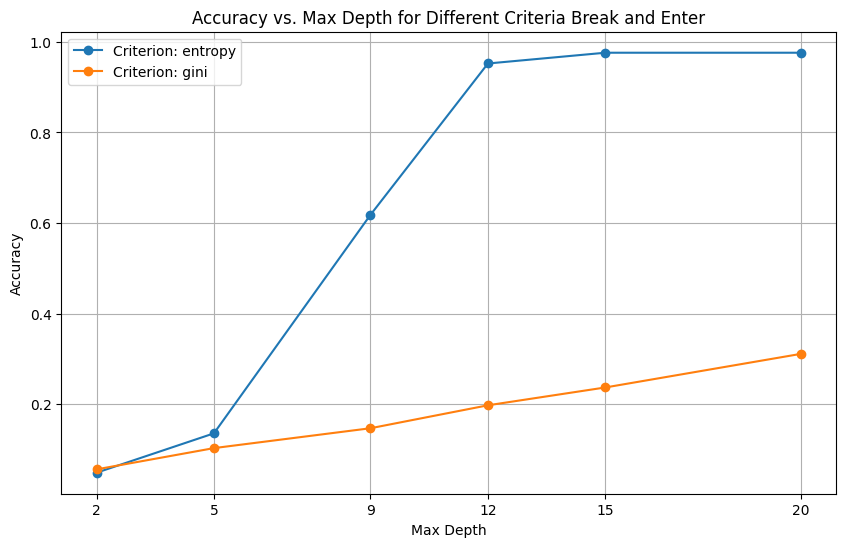

'Domestic Violence'

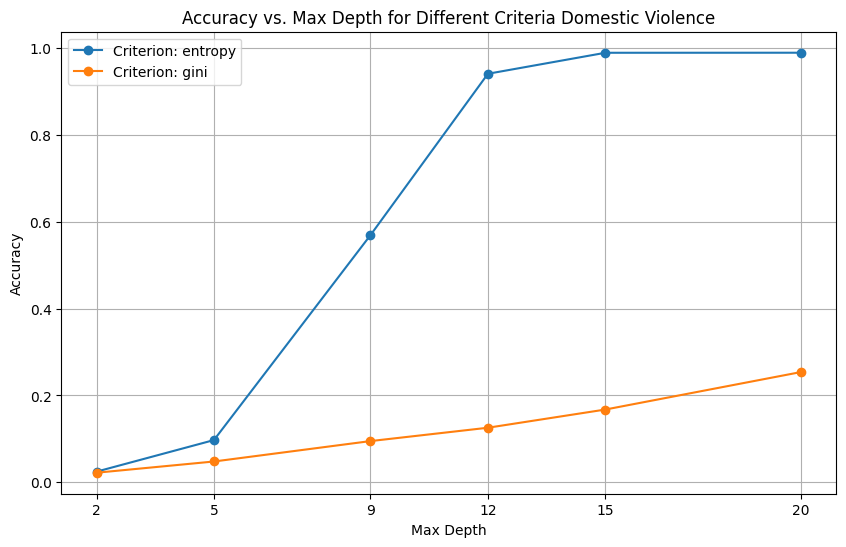

'Public Safety'

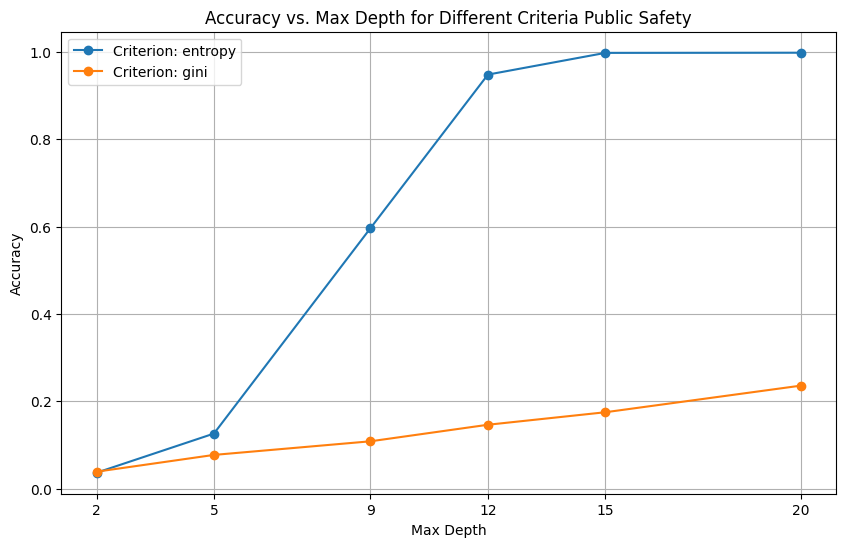

'Social Disorder'

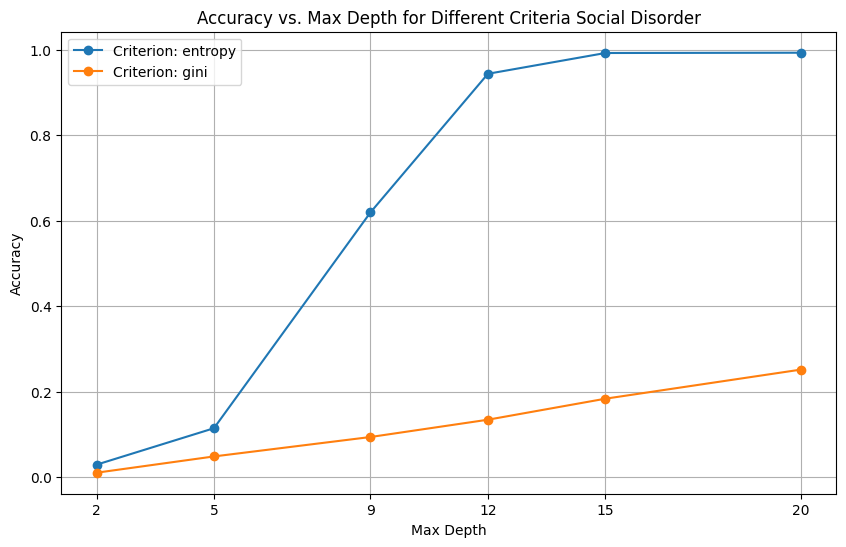

'Theft Under (shoplifting)'

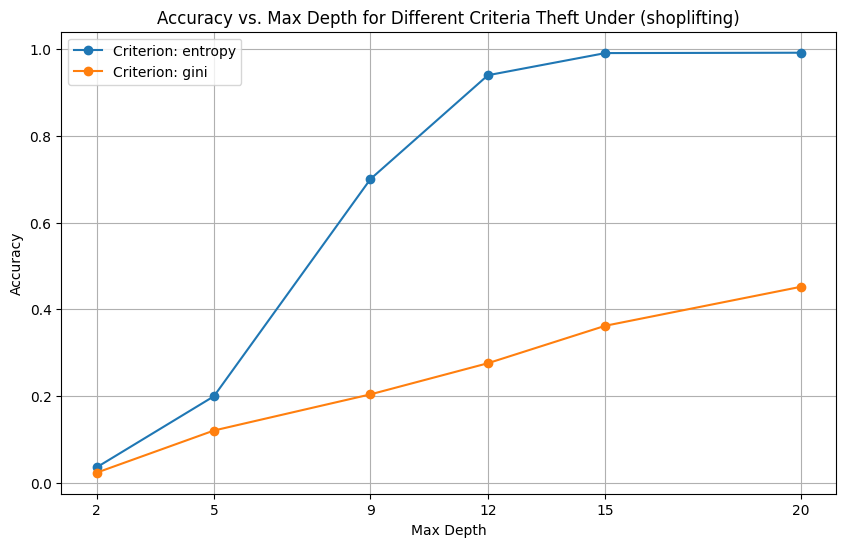

'Offence Against Person'

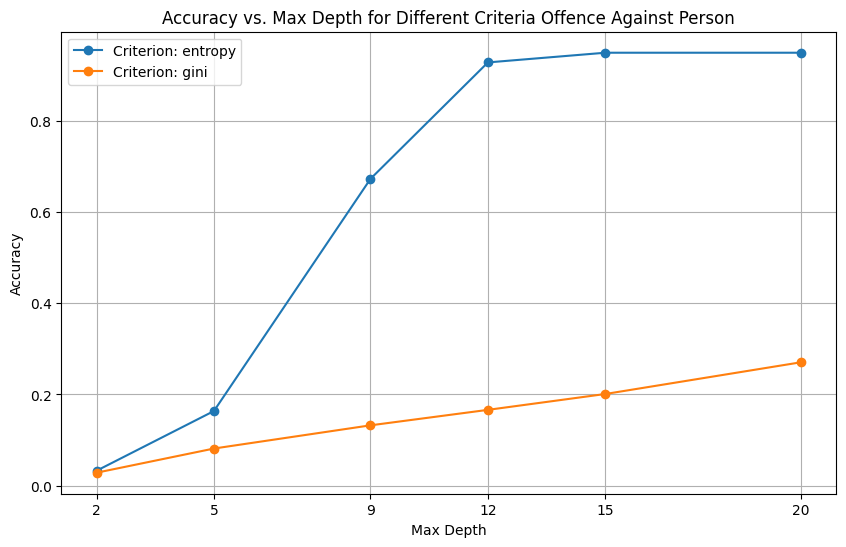

'Mental Health'

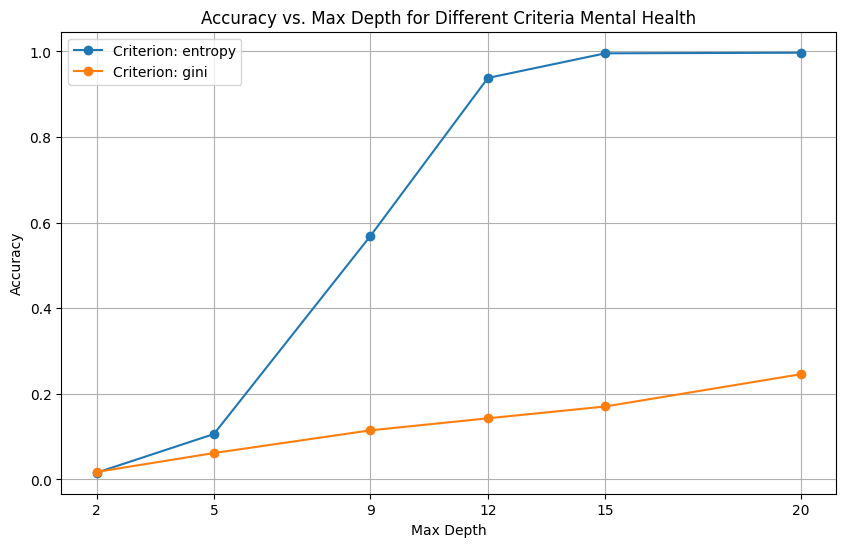

'Auto Theft'

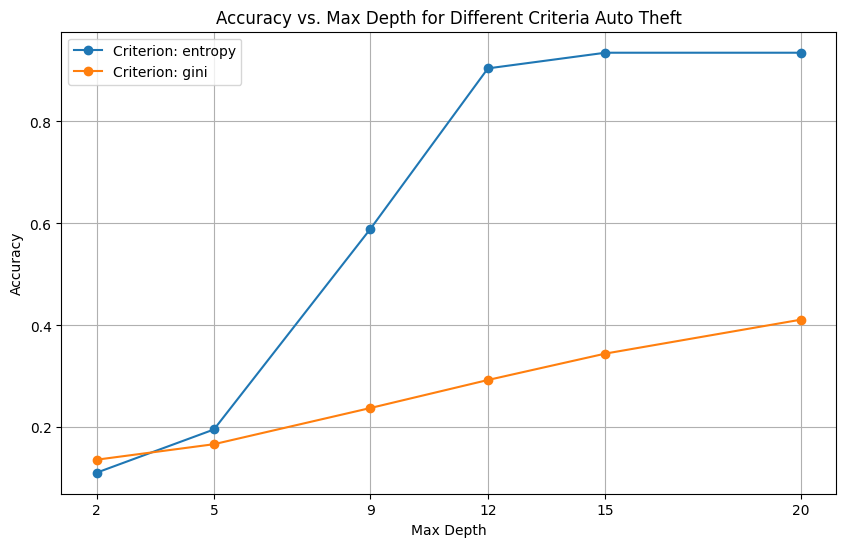

'Fraud'

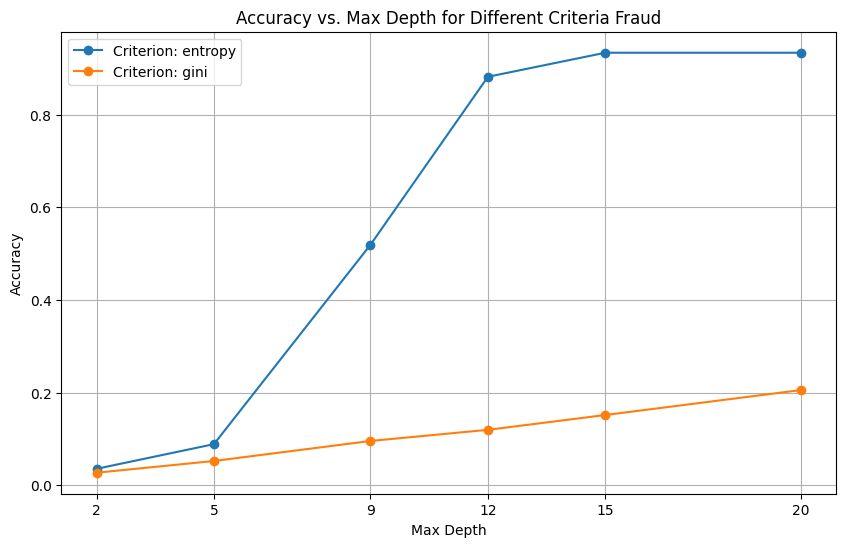

'Robbery'

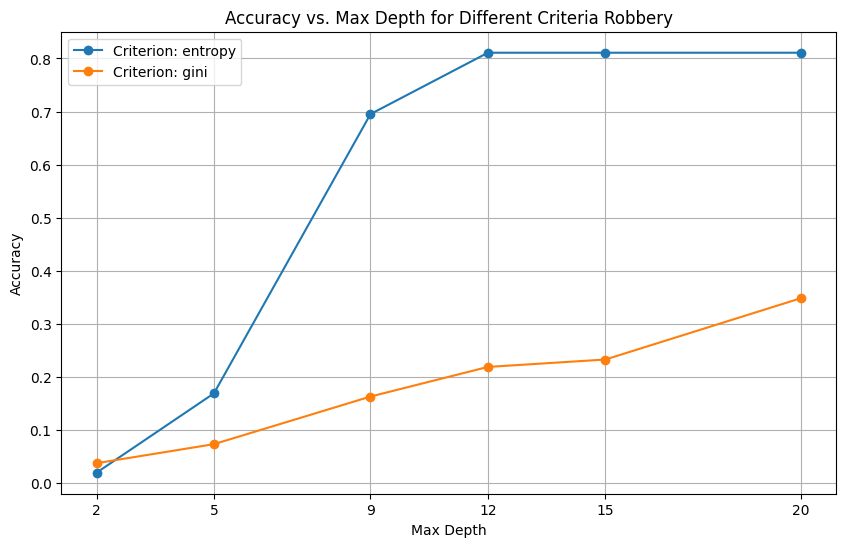

'Theft Over'

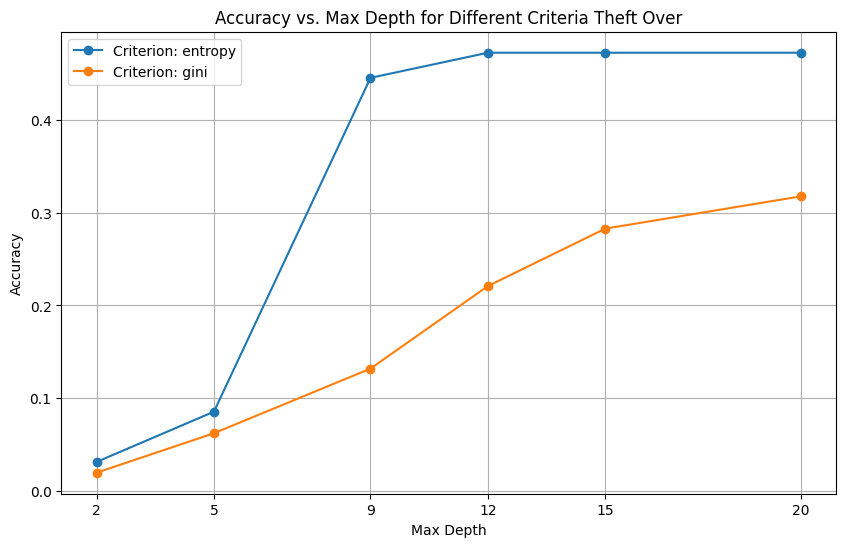

'Human Trafficking'

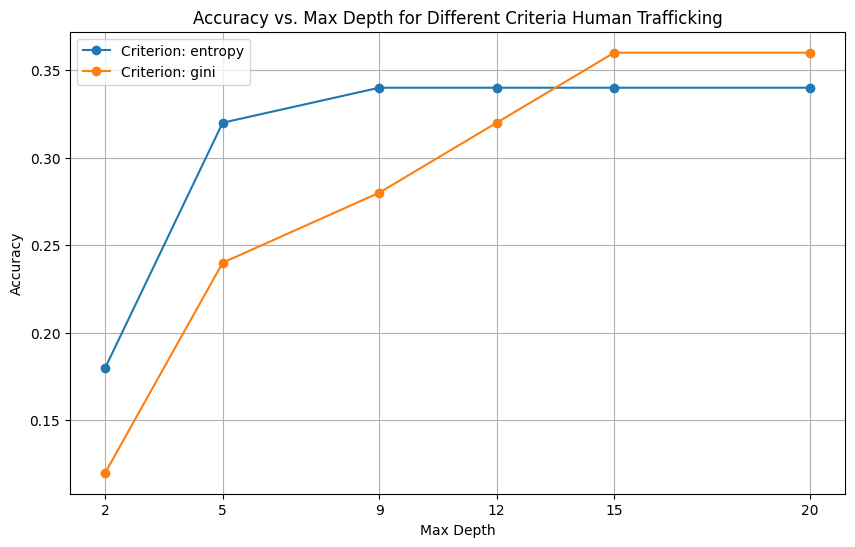

,Max_Depth,Criterion,Accuracy,Predictions,tree_text,correct_predictions,incorrect_predictions,CallGrouping
0,2,entropy,0.048985,"[35300296007, 35300296007, 35300374001, 353003...",|--- prox_idx_childcare <= 0.06\n| |--- prox...,239,4640,Break and Enter
1,2,gini,0.056364,"[35300065001, 35300065001, 35300065001, 353000...",|--- Renter <= 1302.50\n| |--- Unemployment ...,275,4604,Break and Enter
2,5,entropy,0.135889,"[35300377007, 35300377007, 35300237001, 353003...",|--- prox_idx_childcare <= 0.06\n| |--- prox...,663,4216,Break and Enter
3,5,gini,0.103300,"[35300557008, 35300557008, 35300557008, 353005...",|--- Renter <= 1302.50\n| |--- Unemployment ...,504,4375,Break and Enter
4,9,entropy,0.618159,"[35300059003, 35300059003, 35300129003, 353001...",|--- prox_idx_childcare <= 0.06\n| |--- prox...,3016,1863,Break and Enter
...,...,...,...,...,...,...,...,...
139,12,gini,0.320000,"[35300559007, 35300559007, 35300559007, 353005...",|--- Employment rate <= 70.45\n| |--- Popula...,16,34,Human Trafficking
140,15,entropy,0.340000,"[35300559007, 35300559007, 35300559007, 353005...",|--- prox_idx_parks <= 0.03\n| |--- Median t...,17,33,Human Trafficking
141,15,gini,0.360000,"[35300559007, 35300559007, 35300559007, 353005...",|--- Employment rate <= 70.45\n| |--- Popula...,18,32,Human Trafficking
142,20,entropy,0.340000,"[35300559007, 35300559007, 35300559007, 353005...",|--- prox_idx_parks <= 0.03\n| |--- Median t...,17,33,Human Trafficking


In [23]:
#This sends all the data subsets through and then gets the results so we can make selections later

FullSetofClassifer_results = pd.DataFrame(columns=['Max_Depth', 'Criterion', 'Accuracy', 'Predictions','tree_text','correct_predictions','incorrect_predictions'])
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(BreakandEnter_df)], ignore_index=True)
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(DomesticViolence_df)], ignore_index=True)
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(PublicSafety_df)], ignore_index=True)
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(SocialDisorder_df)], ignore_index=True)
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(TheftUnder_df)], ignore_index=True)
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(OffenceagainstPerson_df)], ignore_index=True)
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(MentalHealth_df)], ignore_index=True)
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(AutoTheft_df)], ignore_index=True)
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(Fraud_df)], ignore_index=True)
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(Robbery_df)], ignore_index=True)
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(TheftOver_df)], ignore_index=True)
FullSetofClassifer_results = pd.concat([FullSetofClassifer_results, process_dataframe(HumanTrafficking_df)], ignore_index=True)
display(FullSetofClassifer_results)



,Predictions
0,35300121016
1,35300121016
2,35300121013
3,35300121005
4,35300121005
...,...
4874,35300743001
4875,35300558009
4876,35300943010
4877,35300906003


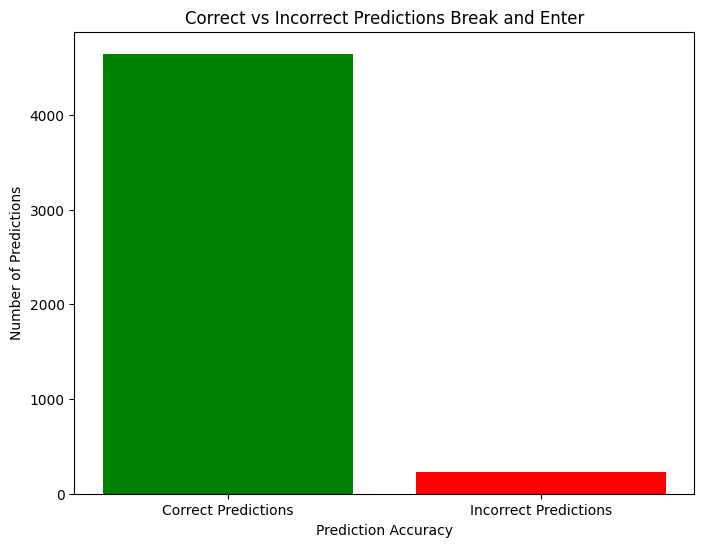

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


,Predictions
0,35300496004
1,35300496004
2,35300496004
3,35300496004
4,35300496004
...,...
17318,35300036002
17319,35300036002
17320,35300029001
17321,35300029001


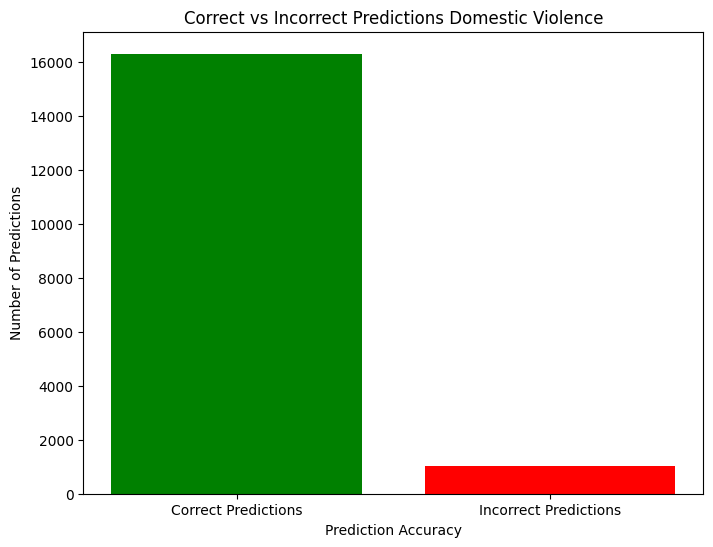

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


,Predictions
0,35301053015
1,35301053015
2,35301053015
3,35301053015
4,35301053015
...,...
38043,35300449002
38044,35300449002
38045,35300449002
38046,35300449002


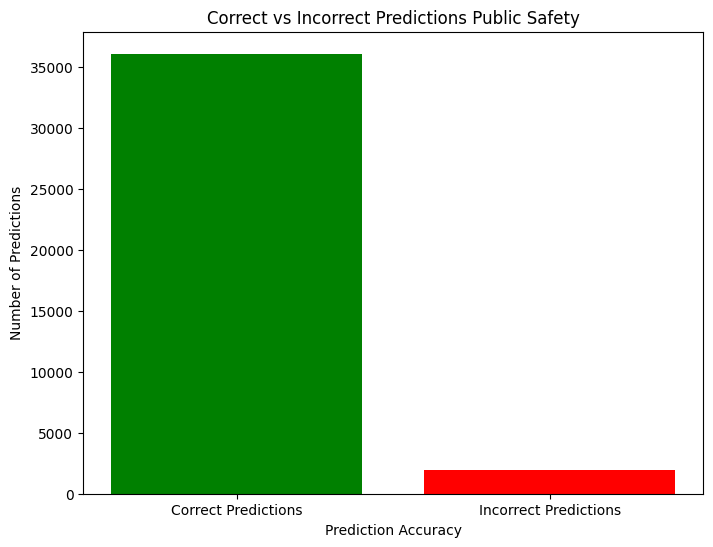

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


,Predictions
0,35300432002
1,35300432002
2,35300432002
3,35300432002
4,35300432002
...,...
19405,35301059002
19406,35301059002
19407,35301059002
19408,35301033018


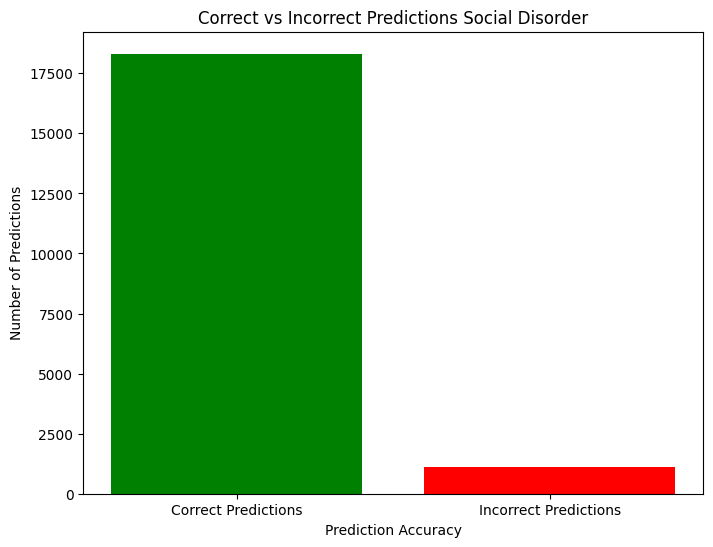

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


,Predictions
0,35301048030
1,35301048031
2,35301048031
3,35300767006
4,35300767006
...,...
14522,35300628002
14523,35300760002
14524,35300942007
14525,35300749015


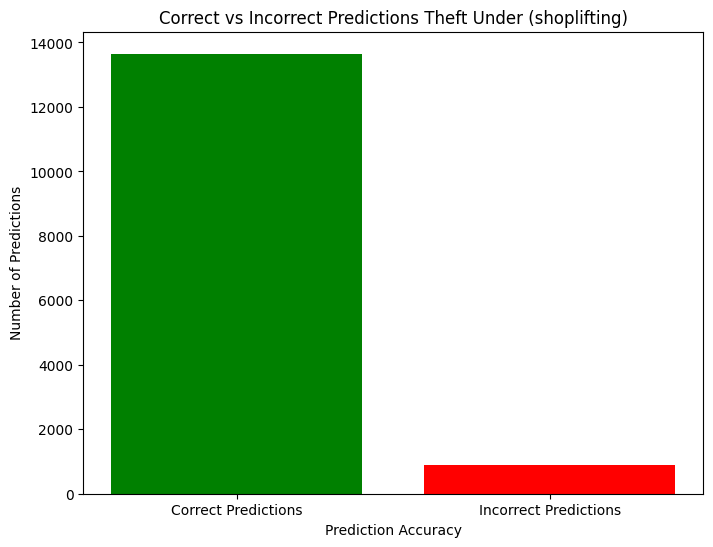

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


,Predictions
0,35300120007
1,35300120007
2,35300120007
3,35300120007
4,35300120007
...,...
4654,35300949005
4655,35300564005
4656,35300832008
4657,35300660012


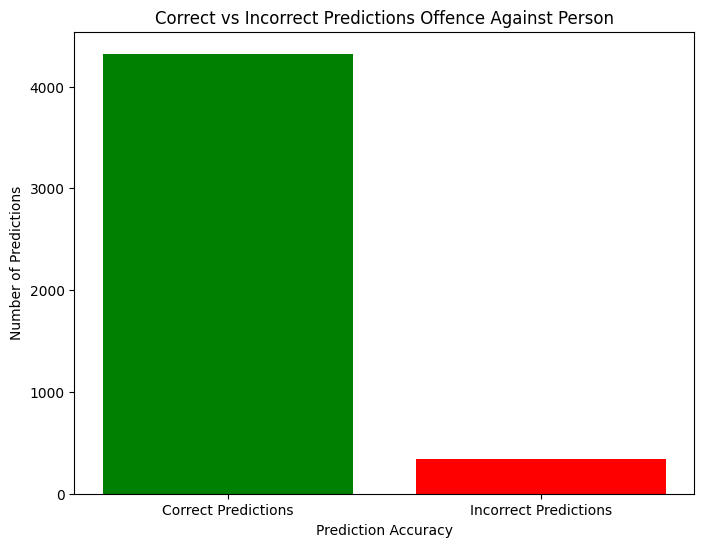

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


,Predictions
0,35300097010
1,35300097010
2,35300097010
3,35300097010
4,35300097010
...,...
49402,35301059002
49403,35301059002
49404,35301059002
49405,35301059002


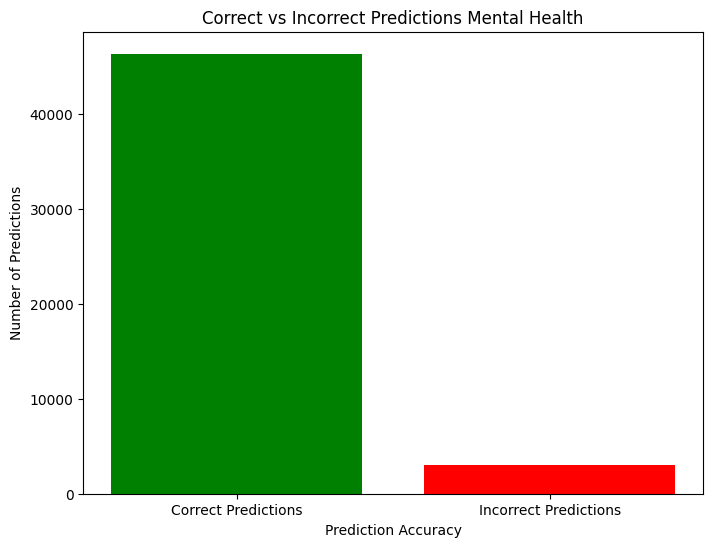

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


,Predictions
0,35300141001
1,35300141005
2,35300141005
3,35300118002
4,35300118002
...,...
3839,35300530001
3840,35300530001
3841,35300122024
3842,35300476005


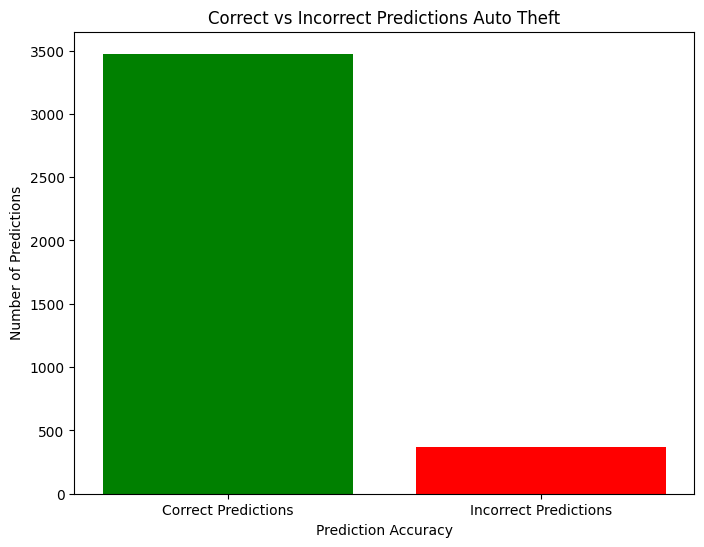

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


,Predictions
0,35300134007
1,35300134007
2,35300134001
3,35300134004
4,35300134002
...,...
4616,35300381023
4617,35300440008
4618,35300727008
4619,35300074001


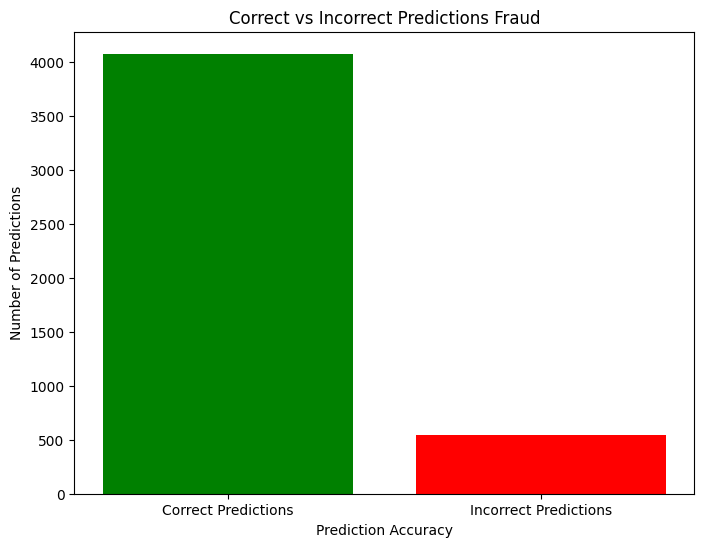

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


,Predictions
0,35300359004
1,35300359004
2,35300589007
3,35300589007
4,35300589007
...,...
497,35301047018
498,35300968004
499,35301007004
500,35300034003


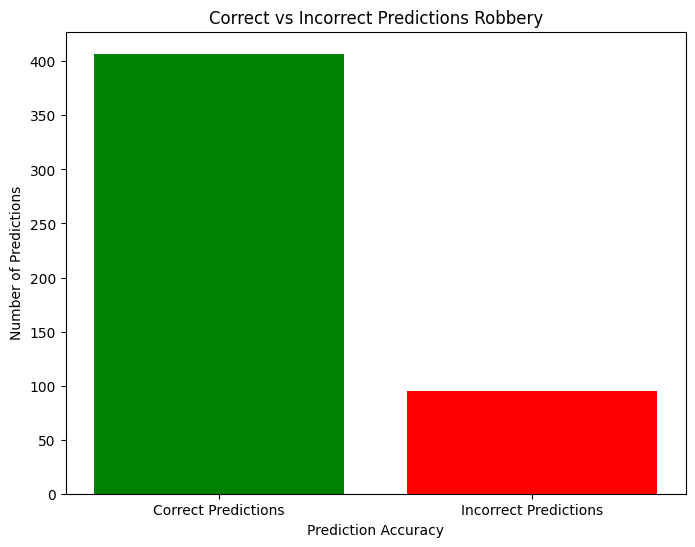

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


,Predictions
0,35300563001
1,35300977003
2,35301007030
3,35301007030
4,35301007030
...,...
253,35301039010
254,35300886009
255,35300886009
256,35300737001


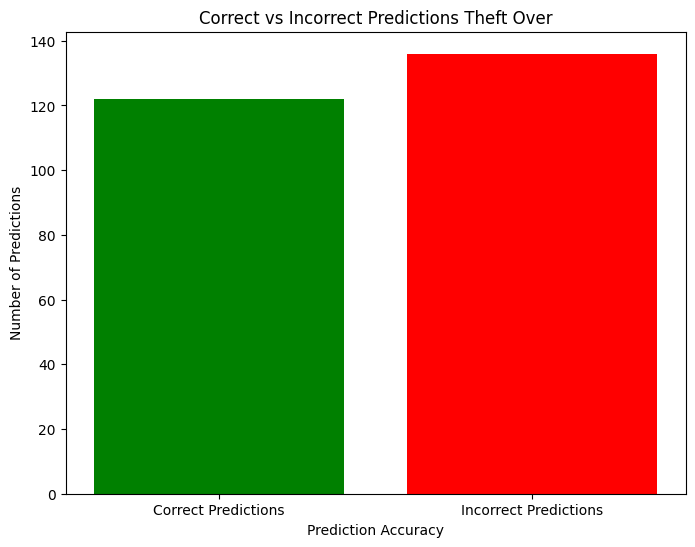

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


,Predictions
0,35300559007
1,35300559007
2,35300559007
3,35300559007
4,35300432020
5,35300432020
6,35300432002
7,35300557018
8,35300557004
9,35300557024


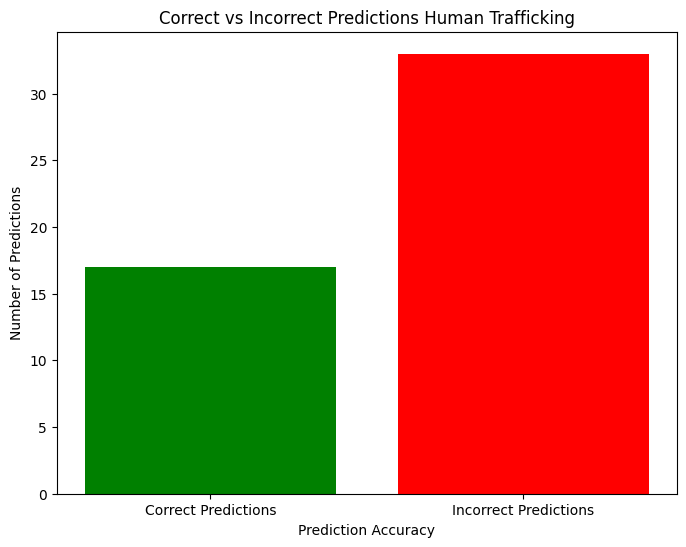

<ipython-input-24-9243a26eea03>:57: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
<ipython-input-24-9243a26eea03>:58: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],


In [24]:
import numpy as np
from branca.colormap import linear

#Previous examinations of the data seemed to indicate Entropy and a depth of 12 was the best fit for the majority of the types
BestofEachType_Classifier = FullSetofClassifer_results[(FullSetofClassifer_results['Criterion'] == 'entropy') & (FullSetofClassifer_results['Max_Depth'] == 12)]
# display(BestofEachType_Classifier)
#Now I want to loop over the results and show the predictions for each type
#1/ Correct vs incorrect predictions
#2/ in a map
#3/ output the tree_text
for index, row in BestofEachType_Classifier.iterrows():
    correct_predictions = row['correct_predictions']
    incorrect_predictions = row['incorrect_predictions']
    CallGroupingName = row['CallGrouping']
    current_predictions = row['Predictions']
    predictions_df = pd.DataFrame({'Predictions': current_predictions}).copy()
    predictions_df = predictions_df.explode('Predictions').reset_index(drop=True)
    prediction_counts = predictions_df.groupby('Predictions').size().reset_index(name='Count')
    tree_text = row['tree_text']
    display(predictions_df)
    # # predictions_df = pd.DataFrame({'Predictions': BestofEachType_Classifier['Predictions'].apply(lambda x: x.tolist())}).copy()
    # predictions_df = predictions_df.explode('Predictions').reset_index(drop=True)
    # # display(predictions_df)
    # prediction_counts = predictions_df.groupby('Predictions').size().reset_index(name='Count')

    # Create labels for the plot
    labels = ['Correct Predictions', 'Incorrect Predictions']
    values = [correct_predictions, incorrect_predictions]

    #Plot the Prediction Accuracy
    plt.figure(figsize=(8, 6))
    plt.bar(labels, values, color=['green', 'red'])
    plt.title(f'Correct vs Incorrect Predictions {CallGroupingName}')
    plt.xlabel('Prediction Accuracy')
    plt.ylabel('Number of Predictions')
    plt.show()

    prediction_counts_sorted = prediction_counts.sort_values(by='Count', ascending=False)

    #Remove the #1 area , each group had one area that messed up the map
    # display('start')
    # display(prediction_counts_sorted)
    prediction_counts_sorted = prediction_counts_sorted.iloc[1:]
    # display(prediction_counts_sorted.head(10))
    # display('end')
    predictions_mergedtoGeographies_df = Waterloo_region_proximity_withGeography_df.merge(prediction_counts_sorted, left_on='DBUID', right_on='Predictions', how='left')
    predictions_mergedtoGeographies_df = predictions_mergedtoGeographies_df.dropna(subset=['Predictions'])
    predictions_mergedtoGeographies_df['Count'] = predictions_mergedtoGeographies_df['Count'].fillna(0)

    Waterloo_region_proximity_withGeography_gdf = gpd.GeoDataFrame(predictions_mergedtoGeographies_df, geometry='geometry')
    Waterloo_region_proximity_withGeography_gdf = Waterloo_region_proximity_withGeography_gdf.set_crs("EPSG:3347")
    Waterloo_region_proximity_withGeography_gdf = Waterloo_region_proximity_withGeography_gdf.to_crs(epsg=4326)
    colormap = linear.RdYlBu_09.scale(predictions_mergedtoGeographies_df['Count'].min(), predictions_mergedtoGeographies_df['Count'].max())
    # display(predictions_mergedtoGeographies_df.head())
    min_value = predictions_mergedtoGeographies_df['Count'].min()
    max_value = predictions_mergedtoGeographies_df['Count'].max()
    m = folium.Map(location=[Waterloo_region_proximity_withGeography_gdf.geometry.centroid.y.mean(),
                         Waterloo_region_proximity_withGeography_gdf.geometry.centroid.x.mean()],
               zoom_start=10)
    choropleth_layer =folium.Choropleth(
      geo_data=Waterloo_region_proximity_withGeography_gdf,
      data=predictions_mergedtoGeographies_df,
      columns=['DBUID', 'Count'],
      key_on='feature.properties.DBUID',
      fill_color='RdYlBu_r',
      fill_opacity=0.7,
      line_opacity=0.2,
      legend_name='Prediction Counts',
      highlight=True,  # Enable hover highlighting,
#       popup=popup
      bins=50,
      # reset=True
    ).add_to(m)
    folium.GeoJsonTooltip(fields=['DBUID', 'Count'], aliases=['Dissemination Block', 'Count']).add_to(choropleth_layer.geojson)

    m.save(f'/content/drive/MyDrive/Group 3 Machine Learning/Project Files/DecisiontreeOutput/{CallGroupingName}.html')
    file_path = f"/content/drive/MyDrive/Group 3 Machine Learning/Project Files/DecisiontreeOutput/decision_tree_text_{CallGroupingName}.txt"
   # Write the tree_text to the file
    with open(file_path, "w") as file:
        file.write(tree_text)